# Task 3 - Epithelial to Mesenchymal (EMT) score from the Hallmark EMT or Epithelial to Mesenchymal Plasticity
This notebook analyses the Epithelial to Mesenchymal (EMT) score from the Hallmark EMT or Epithelial to Mesenchymal Plasticity score from [https://www.science.org/doi/10.1126/sciadv.abi7640](https://www.science.org/doi/10.1126/sciadv.abi7640) as well as HALLMARK.

This notebook is based on the single-cell best practices book (https://github.com/theislab/single-cell-best-practices/). For further explanations of the applied methods please refer to above source.

# Gene set enrichment and pathway analysis 

### Prepare and explore the data

In [1]:
import os
import scanpy as sc
import anndata as ad
import numpy as np
import pandas as pd
import anndata as ad
import anndata2ri
import rpy2
from rpy2.robjects import r
import random
import session_info

anndata2ri.activate()

In [2]:
sc.settings.set_figure_params(dpi=200, frameon=False)
sc.set_figure_params(dpi=200)
sc.set_figure_params(figsize=(4, 4))

In [3]:
%load_ext rpy2.ipython

In [4]:
!python -m rpy2.situation

rpy2 version:
3.5.14
Python version:
3.9.18 | packaged by conda-forge | (main, Aug 30 2023, 03:49:32) 
[GCC 12.3.0]
Looking for R's HOME:
    Environment variable R_HOME: /home/icb/till.richter/anaconda3/envs/r_env/lib/R
    Calling `R RHOME`: /home/icb/till.richter/anaconda3/envs/r_env/lib/R
    Environment variable R_LIBS_USER: /home/icb/till.richter/R/x86_64-conda-linux-gnu-library/4.3
R's value for LD_LIBRARY_PATH:
/usr/local/cuda-11.8/lib64:/usr/local/cuda-11.8/lib64:/usr/local/cuda-11.8/lib64:/home/icb/till.richter/anaconda3/envs/celldreamer/lib:/home/icb/till.richter/anaconda3/envs/celldreamer/lib:/home/icb/till.richter/anaconda3/envs/celldreamer/lib:/usr/local/cuda-11.8/lib64:/usr/local/cuda-11.8/lib64:/usr/local/cuda-11.8/lib64:/home/icb/till.richter/anaconda3/envs/celldreamer/lib:/home/icb/till.richter/anaconda3/envs/celldreamer/lib:/home/icb/till.richter/anaconda3/envs/celldreamer/lib
R version:
    In the PATH: R version 4.3.2 (2023-10-31) -- "Eye Holes"
    Loading R libra

In [5]:
%%R
.libPaths()

[1] "/home/icb/till.richter/anaconda3/envs/r_env/lib/R/library"


In [6]:
%%R
suppressPackageStartupMessages({
    library(SingleCellExperiment)
    library(AUCell)
})

In [8]:
adata_read = sc.read_h5ad('../data/adata/processed_adata1.h5ad')
adata_read.obs

,sample_id,sample_nr,donor,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,log_counts,n_counts,n_genes,size_factors,louvain_r1,louvain_r0.5
AAACCCAAGATCACCT-1-1-0-0,9591-2D,0,mouse,1438,7.271704,3167.0,8.060856,31.796653,43.195453,54.152195,70.382065,158.0,5.068904,4.988949,8.060540,3167.0,1438,0.776404,5,1
AAACCCAAGCACACAG-1-1-0-0,9591-2D,0,mouse,2030,7.616284,5085.0,8.534247,28.456244,40.255654,50.855457,66.096362,255.0,5.545177,5.014749,8.534050,5085.0,2030,1.230932,5,1
AAACCCAAGGCATCTT-1-1-0-0,9591-2D,0,mouse,1581,7.366445,3452.0,8.146998,32.097335,43.134415,53.418308,68.684820,213.0,5.365976,6.170336,8.146709,3452.0,1581,0.795952,3,1
AAACCCAAGGGTAGCT-1-1-0-0,9591-2D,0,mouse,2930,7.983099,9941.0,9.204523,34.513630,46.604969,55.577910,67.629011,885.0,6.786717,8.902525,9.204423,9941.0,2930,2.054774,3,1
AAACCCACACACGGTC-1-1-0-0,9591-2D,0,mouse,650,6.478510,1089.0,6.993933,32.690542,43.801653,58.677686,86.225895,51.0,3.951244,4.683196,6.993015,1089.0,650,0.266634,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGGTAGCTAAA-1-1-0-0,9591-2D,0,mouse,3308,8.104401,11144.0,9.318747,29.872577,41.358579,51.390883,64.348528,451.0,6.113682,4.047021,9.318657,11144.0,3308,2.691594,5,1
TTTGTTGGTTGCTCGG-1-1-0-0,9591-2D,0,mouse,546,6.304449,970.0,6.878326,38.556701,51.340206,64.329897,95.257732,122.0,4.812184,12.577319,6.877296,970.0,546,0.206866,0,0
TTTGTTGTCCACTTTA-1-1-0-0,9591-2D,0,mouse,433,6.073045,594.0,6.388561,30.639731,43.939394,60.774411,100.000000,23.0,3.178054,3.872054,6.386879,594.0,433,0.144676,0,0
TTTGTTGTCCCGTTGT-1-1-0-0,9591-2D,0,mouse,1063,6.969791,1920.0,7.560601,30.729167,41.197917,52.343750,70.677083,75.0,4.330733,3.906250,7.560081,1920.0,1063,0.464146,3,1


Learning from single-cell best practices:
We need to clean up the cell type names, i.e. replace spaces with underscores and remove + symbols, to avoid Python to R conversion issues.

In [9]:
adata_read

AnnData object with n_obs × n_vars = 16747 × 10512
    obs: 'sample_id', 'sample_nr', 'donor', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'log_counts', 'n_counts', 'n_genes', 'size_factors', 'louvain_r1', 'louvain_r0.5'
    var: 'mt', 'n_cells_by_counts-0-0-0', 'mean_counts-0-0-0', 'log1p_mean_counts-0-0-0', 'pct_dropout_by_counts-0-0-0', 'total_counts-0-0-0', 'log1p_total_counts-0-0-0', 'n_cells-0-0-0', 'n_cells_by_counts-1-0-0', 'mean_counts-1-0-0', 'log1p_mean_counts-1-0-0', 'pct_dropout_by_counts-1-0-0', 'total_counts-1-0-0', 'log1p_total_counts-1-0-0', 'n_cells-1-0-0', 'n_cells_by_counts-1-0', 'mean_counts-1-0', 'log1p_mean_counts-1-0', 'pct_dropout_by_counts-1-0', 'total_counts-1-0', 'log1p_total_counts-1-0', 'n_cells-1-0', 'n_cells_by_counts-1', 'mean_coun

## Overlapping gene sets

In [10]:
%%R
library(GSEABase)
# Overlapping
genes_albo = c('Car8',  'Casp1', 'Casp4', 'Cmtm3', 'Cpq', 'Cstdc2', 'Cyp4b1', 'Dnajc10', 'Ecscr', 'Flrt3', 'Gdf10', 'Gkn3', 'Lbp', 'Nepn', 'Serpinb9')
geneSets_albo <- GeneSet(genes_albo, setName="geneSet_albo")
genes_blownup = c('Dmbt1', 'Krt13')
geneSets_blownup <- GeneSet(genes_blownup, setName="geneSet_blownup")
genes_thicklike = c('Ckap4', 'Crip2', 'Fxyd5', 'Hbegf', 'Krt14', 'Nrarp', 'Serinc2', 'Serp2', 'Tenm4', 'Tns4', 'Tspan13', 'Ube2j1')
geneSets_thicklike <- GeneSet(genes_thicklike, setName="geneSet_thicklike")
genes_treelike = c('Il1rn', 'Acsm3', 'Dio3', 'Dio3os', 'Lipa', 'Maoa', 'Nid1', 'Nqo1', 'Spint1', 'Upk1b')
geneSets_treelike <- GeneSet(genes_treelike, setName="geneSet_treelike")

# Only 2D
genes_albo2d = c('Acot1','Anxa13','Car8','Casp1','Casp4','Ccl2','Ccn2','Cmtm3','Cp','Cpq','Crisp1','Cstdc2','Cyp4b1','Ddit4l','Depp1','Dnajc10','Ecscr','Flrt3','Gdf10','Gkn3','Hnf1aos1','Hspb1','Il18','Lbp','Lurap1l','Nepn','Nkain4','Prxl2b','Retreg1','Serpinb6b','Serpinb9','Slfn2','Spink4','St3gal4','Trf','Vkorc1')
geneSets_albo2d <- GeneSet(genes_albo2d, setName="geneSet_albo2d")
genes_blownup2d = c('Csn3', 'Cth', 'Dmbt1', 'Dok2', 'Fabp1', 'Galntl6', 'Krt13', 'Psat1', 'Soat1', 'Sult1c2')
geneSets_blownup2d <- GeneSet(genes_blownup2d, setName="geneSet_blownup2d")
genes_thicklike2d = c("Ly6a", "Cldn2", "Igfbp7", "Palmd", "Ankmy1", "Axl", "Basp1", "Bcl3", "Bpgm", "Ckap4", "Crip2", "Crybg1", "Ddit4", "Eif4e3", "F2r", "Fxyd5", "Galnt1", "Gatm", "Hbegf", "Hmga2", "Ildr2", "Irx3", "Krt14", "Lrrc8c", "Mad2l2", "Map3k2", "Msn", "Nrarp", "Pcolce2", "Pmepa1", "Procr", "Pros1", "Ptp4a3", "Rcc2", "Serinc2", "Serp2", "Slc29a1", "Tenm4", "Tnnt2", "Tns4", "Tspan13", "Tubb6", "Ube2j1")
geneSets_thicklike2d <- GeneSet(genes_thicklike2d, setName="geneSet_thicklike2d")
genes_treelike2d = c('Il1rn', 'Acsm3', 'Cxcl5', 'Dio3', 'Dio3os', 'Prr15l', 'Slc44a3', 'Sptssb', 'Vil1', 'Acp5', 'Apob', 'Fam57a', 'Gjb1', 'Lipa', 'Maoa', 'Mcpt2', 'Nid1', 'Nqo1', 'Ppp1r1b', 'S100a14', 'Slc20a1', 'Spint1', 'Upk1b')
geneSets_treelike2d <- GeneSet(genes_treelike2d, setName="geneSet_treelike2d")

# Only 3D
genes_albo3d = c('1700025G04Rik', '2410002F23Rik', '5730455P16Rik', 'AI506816', 'Abcd1', 'Adh1', 'Ambp', 'Ank', 'Arid5b', 'Aspa', 'Atp1b1', 'Bcap29', 'Bche', 'Cald1', 'Car8', 'Casp1', 'Casp12', 'Casp4', 'Cdh5', 'Cebpd', 'Celf2', 'Cep85l', 'Chd6', 'Cmtm3', 'Cpq', 'Crppa', 'Cstdc2', 'Cxcl5', 'Cyp4b1', 'Dbp', 'Dnajc10', 'Dsel', 'Dtna', 'Echdc2', 'Echdc3', 'Ecscr', 'Edn2', 'Efnb2', 'Ehf', 'Fabp4', 'Fam43a', 'Fcgrt', 'Flrt3', 'Fzd2', 'Gda', 'Gdf10', 'Gkn3', 'Gm8292', 'Gpm6b', 'Grwd1', 'Gstm1', 'Gstm2', 'Hdac2', 'Hhex', 'Iffo2', 'Ifitm2', 'Igfbp4', 'Il6st', 'Isx', 'Kcnq1ot1', 'Khdrbs3', 'Kitl', 'Lamb1', 'Lbp', 'Lpar6', 'Lpl', 'Lrpap1', 'Ltbp4', 'Maged2', 'Mettl1', 'Mex3d', 'Muc3a', 'Nav3', 'Nepn', 'Neto2', 'Nfib', 'Nhs', 'Nr4a2', 'Nrg4', 'Nrgn', 'Nrp1', 'Onecut1', 'Pccb', 'Pde3b', 'Pde9a', 'Pik3c2a', 'Plcxd3', 'Plk2', 'Poc1b', 'Prorp', 'Ptpn13', 'Pycard', 'Rab11fip2', 'Rbbp7', 'Rbms3', 'Rnd2', 'Rorb', 'Rpl27a-ps4', 'Rps26-ps1', 'Scara3', 'Serpinb9', 'Serpini1', 'Slc35g1', 'Smarcd3', 'Snhg8', 'Spon2', 'Stc2', 'Sting1', 'Tenm1', 'Tle4', 'Tmeff2', 'Tmem158', 'Tmem229b', 'Tmem45a2', 'Tnfaip3', 'Tshz1', 'Ugt2b35', 'Zdhhc1', 'Zfhx4', 'Zfp704')
geneSets_albo3d <- GeneSet(genes_albo3d, setName="geneSet_albo3d")
genes_blownup3d = c('0610040J01Rik', '5330417C22Rik', '9530036O11Rik', 'Ablim1', 'Acox2', 'Acsl3', 'Afp', 'Aldh1a7', 'Alpi', 'Anxa10', 'Aqp8', 'C230014O12Rik', 'Casz1', 'Cd68', 'Cdhr5', 'Ceacam1', 'Ces2a', 'Chchd10', 'Ckmt1', 'Clca1', 'Cmtm7', 'Cpt1a', 'Cyp3a13', 'Dmbt1', 'Fa2h', 'Fabp2', 'Fer1l4', 'Fkbp11', 'Galnt12', 'Gata3', 'Gm16285', 'Gm7575', 'Gpr160', 'Homer2', 'Hpgds', 'Ihh', 'Ivl', 'Kcnk1', 'Krt13', 'Krtcap3', 'Laptm5', 'Lypd8', 'Mgll', 'Ms4a8a', 'Muc1', 'Myo1a', 'Odf2l', 'Oit1', 'Pdcd4', 'Pdia5', 'Pdp1', 'Pigr', 'Ppargc1b', 'Prap1', 'Selplg', 'Slc2a6', 'Slc9a4', 'Smpdl3a', 'Sox13', 'Spp1', 'St3gal5', 'Sult1b1', 'Sult1d1', 'Tesc', 'Tff3', 'Tm4sf5', 'Tmc4', 'Tmem151a', 'Tmprss4', 'Tspan1', 'Tspan2', 'Utp14b', 'Zdhhc9')
geneSets_blownup3d <- GeneSet(genes_blownup3d, setName="geneSet_blownup3d")
genes_thicklike3d = c('1810037I17Rik', 'Abhd11os', 'Abhd2', 'Adam15', 'Agpat2', 'Ankrd37', 'Ankrd44', 'Anxa2', 'Apol7a', 'Aqp3', 'Arhgef16', 'Asns', 'B3gnt3', 'Bcas1', 'Bhlhe40', 'Bok', 'Cars', 'Ccng2', 'Cd55', 'Cdkn1a', 'Cept1', 'Cfap45', 'Cgref1', 'Chac1', 'Cideb', 'Cmas', 'Cnksr1', 'Coro2a', 'Ctsd', 'Cyb561', 'Cyp2s1', 'Cystm1', 'Dgat1', 'Dsg2', 'Egln3', 'Eif4ebp1', 'Epb41l4b', 'Ero1l', 'Fam3b', 'Fhl1', 'Gadd45g', 'Gale', 'Galntl6', 'Gch1', 'Gcnt3', 'Ghitm', 'Gjb1', 'Gkn1', 'Gkn2', 'Gltp', 'Gm13881', 'Gm3776', 'Gng12', 'Gprc5a', 'Grk6', 'Gsta1', 'H2-D1', 'H2-K1', 'Hbegf', 'Higd1a', 'Hilpda', 'Hint3', 'Itm2b', 'Klf2', 'Klf6', 'Kras', 'Krt19', 'Krt23', 'Krt8', 'Ldha', 'Ldlrap1', 'Lgals12', 'Lgals2', 'Lmo4', 'Ly6m', 'Me1', 'Micu1', 'Misp3', 'Mlph', 'Mthfd2', 'Myzap', 'Nadk', 'Nars', 'Nbl1', 'Nt5e', 'Nupr1', 'Ociad2', 'Ostf1', 'Paqr5', 'Pglyrp1', 'Pof1b', 'Pqlc3', 'Prr13', 'Prr15l', 'R3hdm4', 'Rab27b', 'Rap1gap', 'Rbp2', 'Rhoc', 'Rhof', 'Ripk3', 'Rnasel', 'Rnf186', 'Rpp25', 'S100a13', 'S100a14', 'S100a16', 'Sdcbp2', 'Selenbp1', 'Serinc2', 'Serpinb5', 'Slc16a3', 'Slc3a2', 'Slc6a20a', 'Smim22', 'Spats2l', 'Sptssb', 'Tagln2', 'Tff2', 'Tm6sf2', 'Tmem189', 'Tmem8', 'Tmem94', 'Tpm2', 'Tspo', 'Ttc39b', 'Tubb4b', 'Txnip', 'Ube2j1', 'Vstm5', 'Zbtb7b', 'Zdhhc21', 'mt-Tm', 'Dhrs7', 'Il13ra1', 'Prss23', 'Spink4', 'Tnxb', '0710001A04Rik', '1700016C15Rik', '1810008I18Rik', '2210407C18Rik', '2610528A11Rik', '2610528J11Rik', '3110053B16Rik', '4930447F24Rik', '5430425K12Rik', '8030462N17Rik', '9130230L23Rik', 'AI467606', 'AU040320', 'Acbd4', 'Acsbg1', 'Adprh', 'Aff4', 'Afg3l2', 'Agr2', 'Akirin1', 'Aldoart1', 'Alkbh5', 'Angptl4', 'Anxa4', 'Anxa5', 'Arhgap22', 'Arpc1b', 'Arrdc3', 'Atf5', 'Atg10', 'Atg12', 'Atp6v0b', 'Atp6v1g1', 'Avil', 'B4galt7', 'Bbc3', 'Bnip3', 'Bnip3l', 'Bsg', 'C77080', 'C9orf72', 'Cab39', 'Camk2b', 'Camk2n2', 'Cant1', 'Cap1', 'Capzb', 'Car9', 'Cavin3', 'Cd151', 'Cd9', 'Cda', 'Cdh17', 'Cdkn2d', 'Ceacam18', 'Cela1', 'Ces2g', 'Cfap57', 'Chmp2a', 'Chmp5', 'Chpt1', 'Cidea', 'Ckap4', 'Clcn2', 'Clic3', 'Clic4', 'Clrn3', 'Clstn1', 'Cltb', 'Cmpk1', 'Crip1', 'Crip2', 'Crlf2', 'Csnk1a1', 'Cwh43', 'Cyb5b', 'Cyp2c65', 'Cyp2d26', 'Cyp4f13', 'Cyp4f14', 'Cyp51', 'Daam1', 'Dap', 'Dctn3', 'Def6', 'Dgka', 'Dhrs1', 'Diaph1', 'Dlg3', 'Dnm2', 'Dstn', 'Dusp6', 'Eaf1', 'Efna1', 'Egln1', 'Eif2s2', 'Elovl1', 'Emp1', 'Eno1', 'Epcam', 'Epop', 'Errfi1', 'Esyt2', 'Evpl', 'F2rl1', 'F3', 'Fam110c', 'Fam135a', 'Fam162a', 'Fbxo6', 'Fdft1', 'Fdps', 'Fgfbp1', 'Fhl2', 'Flnb', 'Fxyd5', 'Gadd45b', 'Galnt6', 'Gapdh', 'Gars', 'Gata4', 'Gk', 'Gm13056', 'Gm13588', 'Gm15912', 'Gm3839', 'Gm45507', 'Gm49329', 'Gm8357', 'Gna14', 'Gnb1', 'Gnpnat1', 'Gpi1', 'Gpr146', 'Gpsm2', 'Grin1', 'Gtf2e2', 'Gucd1', 'H2-T23', 'Hcfc1r1', 'Hmg20b', 'Hpcal1', 'Hrct1', 'Htatip2', 'Ier3', 'Ifi27l2b', 'Igsf8', 'Il11ra1', 'Il18', 'Il1a', 'Ildr1', 'Impa2', 'Isg20', 'Isoc1', 'Isoc2b', 'Itgb4', 'Jam2', 'Jpt1', 'Kcnk5', 'Kctd11', 'Kdelr3', 'Kdm7a', 'Krt14', 'Krt18', 'Lemd2', 'Lims2', 'Lmo7', 'Lrp10', 'Lrrc26', 'Ly6g6c', 'Lypd3', 'Maff', 'Mars1', 'Mb21d2', 'Mbnl2', 'Mettl7b', 'Mif', 'Mpi', 'Mrc1', 'Mrpl28', 'Msmo1', 'Mtmr6', 'Muc5b', 'Mvp', 'Myo15b', 'Mzt1', 'Nampt', 'Nat9', 'Ncoa4', 'Ndfip2', 'Ndrg1', 'Necap2', 'Nrarp', 'Nrn1', 'Nudt18', 'P4ha1', 'P4ha2', 'P4hb', 'Pacrg', 'Paxx', 'Pck2', 'Pdk1', 'Pfkp', 'Pgam1', 'Pgf', 'Pgk1', 'Pgm1', 'Pheta1', 'Phf10', 'Phf11d', 'Phf13', 'Pmaip1', 'Pnliprp2', 'Pold4', 'Ppfia3', 'Ppm1j', 'Ppp1r18', 'Prelid2', 'Prkx', 'Prl2c2', 'Prl2c3', 'Prl2c5', 'Psph', 'Ptk2b', 'Ptp4a2', 'Pvr', 'Pxdc1', 'Pxk', 'Rab17', 'Rab2a', 'Rabggta', 'Rap1gapos', 'Rap2b', 'Rasa4', 'Rbp1', 'Rer1', 'Rgs17', 'Rhoa', 'Riok3', 'Rmc1', 'Rnf181', 'Rnf19b', 'Rras', 'S100a1', 'S100a11', 'Sar1b', 'Sc5d', 'Scp2', 'Scrn1', 'Sdf4', 'Sec11c', 'Selenoi', 'Serp2', 'Serpinb1a', 'Serpinb6a', 'Serpine1', 'Sh3bgrl3', 'Shc1', 'Sigmar1', 'Slc16a6', 'Slc1a4', 'Slc25a10', 'Slc25a20', 'Slc26a6', 'Slc2a1', 'Slc2a10', 'Slc35e4', 'Slc66a2', 'Slurp1', 'Smagp', 'Smim15', 'Smtnl2', 'Snord118', 'Snord13', 'Sod1', 'Sowahc', 'Spata6', 'Sqle', 'Sra1', 'Stap2', 'Stard10', 'Stim2', 'Stom', 'Sult2b1', 'Tacc2', 'Tenm4', 'Tes', 'Tfap2a', 'Tinagl1', 'Tm2d1', 'Tmco4', 'Tmem150b', 'Tmem176a', 'Tmem176b', 'Tmem203', 'Tmem238l', 'Tmem43', 'Tmem50a', 'Tmem59', 'Tmem71', 'Tmsb10', 'Tmtc2', 'Tnfrsf12a', 'Tnfrsf18', 'Tnfrsf23', 'Tnip3', 'Tns4', 'Tpd52', 'Tpi1', 'Tpm1', 'Tpm4', 'Tppp', 'Trappc6a', 'Trib3', 'Trim47', 'Trp53inp2', 'Trpm4', 'Tsc22d1', 'Tspan13', 'Tspan7', 'Tstd3', 'Ttc5', 'Tuba1c', 'Tubb2a', 'Txndc12', 'Ubl4a', 'Unc13a', 'Unc13d', 'Urah', 'Vasp', 'Vegfa', 'Vmn2r79', 'Wincr1', 'Yars', 'Yipf5', 'Ypel3', 'Ywhag', 'Ywhaz', 'Zbtb18', 'Zdhhc2', 'Zfp706', 'Zg16', 'mt-Tp', 'mt-Tv')  
geneSets_thicklike3d <- GeneSet(genes_thicklike3d, setName="geneSet_thicklike3d")
genes_treelike3d = c('Ephx2', 'Acaa1b', 'Upk1b', 'Spint1', 'Klhl13', 'Acsm3', 'B4galt4', 'Dio3', 'Dio3os', 'Dsc2', 'Hal', 'Il1rn', 'Lipa', 'Maoa', 'Nid1', 'Nqo1', 'Tafa5', 'Ttc36', 'Zfp36l2')
geneSets_treelike3d <- GeneSet(genes_treelike3d, setName="geneSet_treelike3d")

Loading required package: annotate
Loading required package: AnnotationDbi
Loading required package: XML

Attaching package: ‘XML’

The following object is masked from ‘package:tools’:

    toHTML

Loading required package: graph

Attaching package: ‘graph’

The following object is masked from ‘package:XML’:

    addNode



In [11]:
%%R
library(GSEABase)
genes_branched_mes_2D = c('Rsad2', 'Zbp1', 'Ndn', 'Gm20658', 'Oasl2', 'Nrxn2', 'Clec4d', 'A330076H08Rik', 'Cmpk2', 'Nrxn1', 'Ifi209', 'Gsta2', 'Ddx60', 'Gsta3', 'Tgtp1', 'Dhx58', 'Gas7', 'Bmper', 'Gbp7', 'Cxcl10', 'A930038B10Rik', 'Itih2', 'Ces1f', 'Vav3', 'Rspo3', 'Slfn8', 'Milr1', 'Olfm1', 'Snai1', 'Prss22', 'Gbp2', 'Igfbp5', 'Gm22303', 'Rpl12-ps1', 'Ccl7', 'Hdac1-ps', 'Irf7', 'Cyp2d22', 'Il18bp', 'Psmb9', 'Mx2', 'Sync', 'Adgra1', 'Tescl', 'Syt12', 'Itgb8', 'Bst2', 'Irgm2', 'Dclk1', 'Mylip', 'Mndal', 'Chst1', 'Aox1', 'Gm25492', 'Blvrb', 'Snord65', 'Slc27a3', 'Gm50260', 'Rasl10a', 'Atp9a', 'Tnc', 'Adamts14', 'Crlf1', 'Gm5277', 'Snora21', 'B230217C12Rik', 'Gm20559', 'Lurap1', 'B4galnt4', 'Stat1', 'Clip4', 'Megf10', 'Ccl2', 'Gjc1', 'A130012E19Rik', 'Acox2', 'Gm24507', 'Zfp334', 'Gm379', 'Plekhh2', 'Spns2', 'Gm6133', 'Stbd1', 'Acot1', 'Megf9', 'Mapkbp1', 'Aldh3a1', 'Tap1', 'Ngf', 'Ccdc136', 'Tanc2', 'Nudc-ps1', 'Gm22748', 'Cbr3', 'Gja1', 'Rgs17', 'Msx3', 'Col7a1', 'B230362B09Rik', 'H4c14', 'Gm12607', 'Enah', 'Nrp1', 'Shox2', 'Zfp937', 'Map1a', 'Chst2', 'Gm47863', 'Herc6', 'Trim12c', 'Gpc6', 'Casp12', 'Osr1', 'Rgs10', 'Gm15661', '2610307P16Rik', 'Ube2l6', 'Rab7b', 'Pcdh19', 'Ifi204', 'Evc', '4933412E12Rik', 'Parp14', 'Igtp', 'Gm15050', 'Ifi35', 'Repin1', 'Gm26175', 'Gm26448', 'Gpr137b', 'Gm16141', 'Gm19426', 'Gm34455', 'Loxl2', 'Asrgl1', 'Sh3bp2', 'Cep112', 'Srxn1', 'Gm23639', 'Enpp2', 'Il15ra', 'Wnt5a', 'Dbn1', 'Snora31', 'Ifi211', 'Irf9', 'Gadd45a', 'Lrch2', 'Nes', 'Gm25636', 'Gm24233', 'Gm45871', 'Egfr', 'Lhfpl2', 'Ankmy1', 'Gm22786', 'Stard13', 'Chst15', 'Ccdc103', 'Ly75', 'Cplx2')
geneSets_branched_mes_2D <- GeneSet(genes_branched_mes_2D, setName="geneSet_branched_mes_2D")

genes_branched_mes_3D = c('Ndn', 'Scara5', 'Gm20658', 'Agt', 'Adgra1', 'Ces1f', 'Ank2', 'Nrxn2', 'Rspo3', 'Syt13', 'Srpx2', 'Clec4d', 'Pard6g', 'Trim54', 'St18', 'Kctd12', 'Slc25a48', 'Olfm1', 'Megf9', 'Gsta3', 'Ppp1r14c', 'Gm42679', 'Gsta2', 'Gng4', 'Rps6ka6', 'Gas7', 'Lrrc75b', 'Rnf182', 'Aldh3a1', 'Gm5886', 'Fat4', 'Slc8a1', 'Nefl', 'Nrxn1', 'St8sia4', 'Rarb', 'Fyb', 'Chst2', 'Peg12', 'Plxdc2', 'Alpl', 'Slpi', 'Soga3', 'Fam171b', 'Ankrd33b', 'B3galt1', 'H60b', 'Ngf', 'Hcn1', 'Cxcl14', 'Prr7', 'Steap3', 'Bpifb4', 'Uchl1', 'Fbln7', 'Hmx2', 'Cpt1c', 'Nrp2', 'Gm567', 'Gm45463', 'Nid1', 'Dclk2', 'Tnc', 'Mir763', 'Rab36', 'Klf12', 'Cnksr2', 'Milr1', 'Cdkn2a', 'Cdh10', 'Hoxa7', 'Enpp2', 'Gm25636', 'Enah', 'Robo1', 'Megf10', 'Pcdhgc3', 'D630045J12Rik', 'E2f7', 'Csgalnact1', 'Nav2', 'Syn3', 'Gm10701', 'Plcg2', 'Acot1', 'Gm48008', 'Gpr161', 'Iigp1', 'Prl2c2', 'Clca3b', 'Adamtsl1', 'Fetub', 'Klk10', 'Lhfpl2', 'Cd1d1', 'Gm14002', 'Sned1', 'Cfap300', 'Armcx4', 'Cep112', 'B4galnt4', 'Igfbp5', 'Cep126', 'Il18rap', 'Mtfr2', 'Padi2', 'Dpyd', 'Cdk5r1', 'Ifit1', 'Adam23', 'Havcr2', 'Ppp2r2b', 'Gbp3', 'Gm45902', 'Bdh2', 'Stc1', 'Hotairm1', 'Pif1', 'Akap17b', 'Depdc1b', 'Casc4', 'Mybl1', 'Aox1', 'Flnc', '3100003L05Rik', 'Meis1', 'Ust', 'Trim62', 'Gm49759', 'Ifi207', 'Gm37121', 'Camkk1', 'Pdzd4', 'Mypopos', 'Ptgs2', 'Rgs10', 'Cit', 'Fam171a2', 'Camk1d', 'Ccdc136', 'Nptxr', 'G630016G05Rik', 'Cxcl10', '1190005I06Rik', 'Lrp8', 'Repin1', 'Sgcb', 'Basp1', 'Jph1', 'Nrk', 'Fut10', 'Kif7', 'Gm10524', 'Zfp462', 'Arhgap32', 'Magee1', 'Adra1b', 'Foxred2', 'Sh3bp2', 'Lrp4', 'Nptx1', 'Ltbp1', 'Sstr2', 'Pitpnm2', 'Cgas', 'Top2a', 'Ifit3b', 'Oasl2', 'Cenpf', 'E2f8', 'Gpr137b', 'Mtss2', 'Gm44645', 'Synpo', 'Tafa5', 'Frmd4a', 'Vasn', 'Ifit3', 'Iffo1', 'Sall2', 'Hrob', 'Atp10d', 'Hivep3', 'Greb1', 'H2ac5-ps', 'Cdk5rap2', 'Trim30a', 'Brip1', 'Pcdhb16', 'H2ac4', 'Fkbp10', 'Stil', 'A330084C13Rik', 'Srxn1', 'Chst15', 'Gcnt4', 'Blvrb', 'Rad54b', 'Tbc1d4', 'Ddias', 'Gm10110', 'Map1b', 'Tex9', 'Bub1', 'Map3k20', 'Tulp3', 'Mybl2', 'Lmnb1', 'H1f5', 'Rnf227', 'Fign', 'Slc7a11', 'Mex3a', 'Casp12', 'Adgrl1', 'Fanci', 'Aspm', 'Adamts12', 'Irak1bp1', 'Msantd3', 'Adgrl3', 'Sobp', 'Ncapg', 'Nuf2', 'Kif14', 'Txndc16', 'Gbp7', 'Cdc6', 'Gm9833', 'Arhgap44', 'Kif18b')
geneSets_branched_mes_3D <- GeneSet(genes_branched_mes_3D, setName="geneSet_branched_mes_3D")

genes_cystic_2D = c('Nr0b2', 'Krt13', 'Galntl6', 'Fabp1', 'Csn3', 'Fut2', 'Slc2a6', 'Homer2', 'Aqp8', 'Mogat2', 'Golt1a', 'Tmem47', 'Gm38197', 'Sult1d1', 'Pik3c2g', 'Gm36955', 'Prkaa2', 'Soat2', 'Gm20467', 'Phlda2', '4833407H14Rik', 'Ush1g', 'Rnf125', 'Ceacam1', 'Dmbt1', 'Kdm5d', 'Gldc', '5330417C22Rik', 'Prxl2a', 'Cdhr5', 'Aim2', 'Fabp2')
geneSets_cystic_2D <- GeneSet(genes_cystic_2D, setName="geneSet_cystic_2D")

genes_cystic_3D = c('Tesc', 'Spdef', 'Tff3', 'Pla2g10os', 'Sult1b1', 'Tspan1', 'Ivl', 'Kcnk1', 'Gm9888', 'Ptprn2', 'Laptm5', 'Tm4sf5', 'Cdhr5', 'Fabp2', 'Lmo2', 'Oit1', 'Psapl1', 'Ces1b', 'Tmc4', 'Afp', 'Egfros', 'Fhit', 'Gm40348', 'Prap1', 'Chst13', '1700066B19Rik', 'Atp10b', 'Aldh1a7', 'Cd68', 'Tmem139', 'Ppargc1b', 'Plin5', 'Gm6545', 'Clmn', 'Slc2a6', 'Gm8378', 'Smpdl3a', 'Tspan2', 'Gm44292', 'Nexmif', 'Muc1', 'Ms4a8a', 'Acox2', 'Ush1g', 'Gm15133', 'Gm4468', 'Cybrd1', 'Lypd8', 'Tmprss4', 'Kcnq1', 'Ccdc116', 'Adgrg2', 'Pdcd4', 'Plcxd2', 'Eif4e3', 'Chchd10', 'Gm44867', 'Prkaa2', 'Gabre', 'Tmem51os1', '0610040J01Rik', 'Rufy4', 'Xkr9', 'Mgll', 'Igf2bp1', 'Pik3c2b', 'Ceacam1', 'Gm10603', 'Glul', 'Cldn23', 'Btg2', 'Gm13822', 'Ccl20', 'Galnt3', 'Lingo4', 'Tnfsf4', 'Mall', 'Sec16b', 'Tnni2', 'mt-Nd3', 'Oprd1', 'Otop3', 'Adap1', 'Slc9a2', 'Ncmap', 'Gm45353', 'Onecut3', 'Gm37145', 'Neurl3', 'Gm49785', 'Tmem151a', 'Shroom3', 'Ap1s3', 'St3gal6', 'Mfsd4b3-ps', 'Kctd14', 'Galnt12', 'Bfsp1', 'Fam83f', 'Bicdl1', 'Rab11fip1', 'Ang', 'Tmlhe', 'Gm9905', 'Lgals4', 'Rflnb', 'Acad11', 'Srgap1', 'Gm45640', 'Cblc', 'Rbks', 'Ablim1', 'Zfp36', 'Foxa1', 'Gm43788', 'Ccdc85c', 'Vill', 'Pilrb2', 'Nkx2-3', 'Kcnk6', 'Mgat4a', 'Ccnd2', 'K230015D01Rik', 'Slc39a4', 'Naip2', 'Gramd1c', 'Mecom', 'Egfr')
geneSets_cystic_3D <- GeneSet(genes_cystic_3D, setName="geneSet_cystic_3D")

genes_firework_2D = c('Crabp1', 'Stpg4', 'Tecrl', 'Cd200r4', 'Ucp1', 'Pycard', 'Tac1', 'Ly6a2', 'BB287469', 'Gm29865', 'Ly6c2', 'Gm10421', 'Pcdh20', 'Lum', 'Gm15473', 'Gap43', 'Wfdc3', 'D5Ertd615e', 'Prkd1', 'Dcn', 'Dlx1', 'Cd53', 'Akr1c18', 'Dlx2', 'Erc2', 'Stc1', 'Gfpt2', 'Trbc2', 'Rasgrf1', 'Chrna1', 'Isl1', 'Crabp2', 'Nrep', 'Dact3', 'Gfra4', 'Phkg1', 'AA467197', 'Cspg4', 'Lama4', 'Sh2d5', 'Calhm2', 'Amigo2', 'Penk', 'Gm39822', 'Pcna-ps2', 'Ptchd1', 'Qpct', '0610039K10Rik', 'Tmem74', 'Slc14a1', 'Gm14636', 'Trp53i11', 'Mertk', 'Msx1', 'Fzd3', 'Xkr5', 'Snord87', 'Timp1', 'Sox2', 'Nefm', 'H2bu2', 'Gm7730', 'Gm10054', 'Gpr149', 'Chst7', 'Foxc2', 'Gm46542', 'Jam2', 'Inhba', 'Gm38042', 'Sncg', 'Gm4117', 'Scn2a', 'Sema7a', 'Hectd2', 'Junos', 'Kcnk2', '1700012B09Rik', 'Tmem202', 'Map3k8', 'Hao1', 'Gng11', 'Adam19', 'Lsp1', 'Klhl23', 'Gm28809', 'Gm5292', 'Gfra1', 'Mfap3l', 'Pdgfrb', 'Kcnk4', 'Ttc9', 'Htr1b', 'Olfml2b', 'Fut4', 'Hebp1', 'Stard9', 'Slc43a3', 'Mir7688', 'Cd300lb', 'Aig1', 'Crisp1', 'Upp1', 'Snrpert', 'H3c4', 'Col5a2', 'Prkcb', 'Pthlh', 'Ccbe1')
geneSets_firework_2D <- GeneSet(genes_firework_2D, setName="geneSet_firework_2D")

genes_firework_3D = c('Lrrc17', 'Trabd2b', 'Sez6', 'Lum', 'Crabp1', 'Dpt', 'Pcdh20', 'Aspn', 'Hmcn1', 'Fam189a1', 'Spata3', 'Ube2ql1', 'Acta2', 'Akr1c18', 'Gm22786', 'C3ar1', 'Col3a1', 'Cryzl2', 'Gm29865', 'Lbhd2', 'Gm42675', 'Serpine2', 'Sncg', 'Mcam', 'Ace', 'B3galnt1', 'Pde8a', 'Gm29340', 'Gm8130', 'Bcl6b', 'Slc16a11', 'Klhl23', 'Tenm3', 'Erc2', 'Gm10421', 'Dok2', 'Nme2', 'Gm43517', 'Gm24233', 'Gm22767', 'Tac1', '4833419F23Rik', 'mt-Ts2', 'Pycard', 'Gm15728', 'mt-Tf', 'Crisp1', 'Tubb3', 'Vegfd', 'Dact2', 'Snord87', '4930548K13Rik', '2610528A11Rik', 'Snord82', 'Kctd4', 'Gm28641', 'Slc14a1', 'Fut9', 'Gm50260', 'Col5a2', 'Arnt2', 'D130040H23Rik', 'Gm22003', 'Adam12', 'Gm25395', '4921536K21Rik', 'Chst3', 'Msl3l2', 'Snord49b', 'Scarf2', 'Postn', 'Klhl1', 'Fbn1', 'Rasgrf1', 'Tecrl', 'Wfdc3', 'Fbln2', 'Dock8', 'Gask1b', 'Pde3b', 'Pla2r1', 'Pkia', 'Rbm20', 'Col1a1', 'H2ac6', 'Ak1', 'Ptprb', 'Fam167a', 'Gm7967', 'CAAA01147332.1', 'Gm25394', 'Fam78b', 'Hmgb1-ps7', 'Ankrd1', 'E330032C10Rik', 'Chrna1os', 'Ecrg4', 'Nexn', 'Igsf9b', 'B130024G19Rik', '1700012B09Rik', 'Olfml2b', 'Sorcs2', 'Gm22748', 'Tacc1', 'Gm1673', 'AU021092', 'Ccsap', 'Slfn10-ps', 'mt-Tc', 'Calhm5', 'Gm49138', 'Smim10l2a', 'Gm22513', 'Gm23287', 'Tgfb3', 'Msrb3', 'Fut4', 'Hist1h2an', 'Dpysl3', 'Gm6204', 'Gm8730', 'Twist2', 'Palmd', 'Rangrf', 'Ltbp4', 'Syn1', 'Penk', 'Sema5a', 'Opn3', 'Jam2', 'Rps2-ps10', 'Foxc2', 'Pter', 'H2bu2', 'Ddit4l', 'Adcy7', 'Plxnb1', 'mt-Tl2', 'Hebp1', 'Zfp518b', 'Lpcat2', 'Gm24616', 'Ulbp1', 'Csrp2', 'Wipf1', 'Zcwpw2', 'Selp', 'Osbpl6', 'S100a4', 'Nod1', 'Vash2', 'Ccdc74a', 'Nat14', 'Scx', 'Mical1', 'Msn', 'Dennd2a', 'Gm13160', 'Nuak1', 'Rbms3', 'Il1rap', 'H2ac8', 'Shroom4', 'Xrcc3', 'Id4', 'Gm37108', 'Nova1', 'H3c4', 'Cnn2', 'Snord58b', '2210406O10Rik', 'Crip2', 'Zeb2', 'Adgrg6', 'B9d1')
geneSets_firework_3D <- GeneSet(genes_firework_3D, setName="geneSet_firework_3D")

genes_starlike_2D = c('Ogn', 'Ptn', 'Omd', 'Ccdc80', 'Pde4b', 'Col12a1', 'Adamts5', 'Serpinb9b', 'Rnase10', 'Gm11627', 'Il6', 'Vdr', '4930478M13Rik', 'Tnfaip6', 'Bend5', 'Tgfb2', 'Cbr2', 'Serpine2', 'Tram1l1', 'Tmsb15b1', 'Rcn3', 'Speer3', 'Rprm', 'Fabp5', 'Glt8d2', 'Renbp', 'Podnl1', 'M1ap', 'Adcyap1', 'Cxcl12', 'Tprg', 'Acta2', 'G0s2', 'Azin2', 'Mustn1', 'Cd59a', 'Hecw2', 'Rpl31-ps15', 'Lrrn4cl', 'Emilin1', 'Gm21814', 'Ccn3', 'Slc16a4', 'Gprin3', 'Gm8883', 'Fam171b', 'Itga2b', 'Gm48008', 'Loxl1', 'Rassf9', 'Fgf10', 'Mgp', 'Serpinf1', 'Prelp', 'Ptchd4', 'Snai2', 'Ppil6', 'Dhrs9', 'Prss23', 'Gm15491', 'Gzme', 'Cd302', 'Gypc', 'D130040H23Rik', 'Hist1h2al', 'Gm37760', 'Col1a1', 'Gm15867', 'Gm43573', 'D730045B01Rik', 'Grb14', 'C1rl', 'Pak3', 'Khdrbs3', 'Smim1', 'Sphk1', 'H2bc18', 'Gm6035', 'Cryab', 'Gpr153', 'Lrmda', 'Ckb', 'Tnfrsf11b', 'Fkbp11', 'C130071C03Rik', 'Serpinh1', 'Tslp', 'Gm38391', 'Ddah1', 'Adamts1', 'Pid1', 'Edn1', 'Aqp5', 'Pla1a', 'Aoc2', 'Ttll5', 'Fst', 'Cdc42ep3', 'Tuba1a', 'Gm7240', 'Dnal1', 'Sod3', 'Arhgef9', 'Lockd', 'Cyp2u1', 'Ly6c1', 'Spn', 'Fry', 'Dusp22', 'Lncppara', 'Kdelr3', 'Snhg18', 'Inca1', 'Txndc16', 'Nrg1', 'Tmem45a', 'Sfxn4', 'Gm11520', 'C730034F03Rik', 'Fam229b', 'Tgfb1i1', 'Tnnc1', 'Ddr2', 'H1f1', 'Eva1b', 'Hebp2', 'Cyp1b1', 'Ntn1', 'A530053M12Rik', 'Thbd', 'Cthrc1', 'B3gnt9', 'Dram1', 'Rsph9', 'Gm14403', 'Gm19705', 'Rps7-ps3', 'Gm20257', 'Zfp469', 'Pyroxd2', 'Unc13c', 'H3c15', 'Slc35b3', 'Gas2', 'Phf11d', 'Gnb5', 'Gm13056', 'Creb5', 'Rgcc', 'Gm13166', 'Armcx4', 'Gm42798', 'Gm12602', '0610040B10Rik', 'Bvht', 'Kctd17', 'Cdkn2c', 'H1f10', 'Denn2b', 'Htra1', 'Aebp1', 'P4ha3', 'Foxd2os', 'Ak5', 'Scx', 'Adamtsl3', 'Gm10941', 'Pmp22', 'Pgf', 'Wls', 'Itgb3bp', 'Nuak1', 'R74862', 'Tle6')
geneSets_starlike_2D <- GeneSet(genes_starlike_2D, setName="geneSet_starlike_2D")

genes_starlike_3D = c('G0s2', 'Cfap100', 'Htra3', 'Dbndd1', 'Cyp2d22', 'Klhl30', 'Rcn3', 'Galnt15', 'Il2rg', 'Ripor3', 'S1pr3', 'Nalcn', 'Gpha2', 'Plppr3', 'Pnck', '1700003F12Rik', 'Adm', '4930447F24Rik', 'Gm41724', 'Ltc4s', 'Crygn', 'Ramp1', 'Mustn1', 'Rubcnl', 'Htra1', 'Pgf', 'Stbd1', 'A4galt', 'Ccdc80', 'Ak5', 'Rgcc', 'Gimap9', 'Olfml2a', 'Plac1', 'Gm16104', 'Omd', 'Gm42567', 'Fgf11', 'Lmcd1', 'Slco5a1', 'Lhx9', 'Tmem88', 'A530053M12Rik', 'Gm17546', 'Igfbp6', 'Ccno', 'Podnl1', 'Lepr', 'Tmem121', 'Gm20305', 'Gm30108', 'Bmp4', 'S1pr1', 'BC034090', 'Plau', 'Trpm6', 'Gm20655', 'Spns3', 'Adamts4', 'Gm8995', 'Gm10369', 'C1rl', 'Nos3', 'Fibin', 'Mmp10', 'Gpr176', 'Camk1g', 'Apol9b', 'Masp1', 'Gnb5', 'BC006965', 'Bik', 'Itgb2', 'C1qtnf6', 'Gm15222', 'Gm42928', 'Fhod3', 'Aif1l', 'Stmn2', 'Ctla2a', 'Sh3bp1', 'Pik3ip1', 'Angptl6', 'Gm44220', 'Mmp19', 'Gjb5', 'Adamts2', 'Rnf165', 'Rgs17', 'Nrip2', 'H1f1', 'Prdm8', 'Tmem221', 'Colca2', 'Ifitm3', 'Slitrk5', 'Gm11520', 'Gm4544', 'Fkbp11', 'Slc16a2', 'Gpr35', 'Bvht', 'Spink2', 'Pyroxd2', 'Pdgfra', 'Gm17322', 'Traf5', 'Has2os', 'Sp100', 'Cx3cr1', 'Eng', '9530077C05Rik', 'Rapgef3', 'Hspb1', 'Pla2g7', 'Mertk', 'Neurl2', 'E230025N22Rik', 'Aldh1l1', 'P2rx7', '1600014C23Rik', 'Cav1', 'Apol9a', 'Arl5c', 'Ism1', 'Pdxp', 'Efcc1', 'Aldoart2', 'Apln', 'Prelp', 'Ccl17', 'Tent5b', 'Ghr', 'Gm6944', 'Adat2', 'Foxd2', 'Kcnab2', 'Kdelr3', 'Rem2', 'Tspyl5', 'Asrgl1', 'P4ha2', 'Dgkh', 'Fkbp1b', 'Dhx34', 'AB124611', 'Pmp22', 'Rbp1', 'Adamts7', 'H4c8', 'Rrad', 'Gm43684', 'Gm15270', 'Csf2', 'Mif-ps', 'Snhg16', 'Srrm4', 'Rcor2', 'Hykk', 'Rwdd2a', 'Hspa12b', 'Spn', 'Gstm2', 'Samd11', 'F730043M19Rik', 'Gm44274', 'Mmp3', 'Adamts9', 'Gpsm3', 'Smtn', 'Sp140', 'Mt2', 'Adm2', 'Ptn', 'Ttc12', 'Trib3', 'Fkbp7', 'Nanos3', 'Ifi47', 'Ifi203', 'Rnd1', 'Map6', 'Gm14488', 'Inha', 'Dock6', 'Peli3', 'Rtn2', 'Cacnb1', 'Bgn', 'Tmem176b', 'H1f10', 'Zfp467', 'Mr1', 'D5Ertd605e', 'Ly6a', 'Gm7986', 'Hebp2', '4933412E12Rik', 'Stard6', 'Plekha4', 'Igfbp4', 'Rps19-ps11', 'Fermt2', 'C1qtnf1', 'Rps8-ps5', 'Copz2', 'Irf8', 'Cda', 'Zfp69', 'Gm5491', 'Blnk', 'Gm31166', 'Adssl1', 'P4ha1', 'Gfpt2', 'Gramd1a', 'Gm3716', 'Sorbs3', 'Fcgrt', 'A930038B10Rik', 'Slc27a1', 'Tmem176a', 'Gm26881', 'Pcolce', 'Bnip3', 'Chd5', 'Prrx2', 'Hddc3', 'Hmga1b', '4930550C14Rik', 'Fam118a', 'Emilin2', 'Pdlim4', 'Gm12469', 'Gm2623', 'Paqr3', 'Ackr3', 'Marcksl1', 'Gm8292', 'Nt5dc2', 'Sema3f', 'Mcub', 'Vps37d', 'Sgk1', 'Rassf9', 'Acsbg1', 'Spag4', 'Arap1', 'Zfp9', 'Slc41a3', 'Nmb', 'Aff2', 'Castor1', 'C230013L11Rik', 'Mmp11', 'Cnn3', 'Pdk3', 'Mindy4', 'Lrriq3', 'Rtkn', 'Unc93b1', '1110046J04Rik', 'Gstm7', 'Dok1', 'Ly6e', 'Mapk13', 'Pvt1', 'Rbpj-ps3', 'Tctn1', 'Gm45774', 'Nfil3', 'Vim', 'Gbe1', 'Junos', 'Cdc45', 'Gm34455', 'Gm8330', 'Heg1', 'Sdc3', 'Gm49774', 'Ccdc163', 'Prkar1b', '1700029J07Rik', 'Creb3l4', 'Cacna1a', 'Tubb6', '2900009J06Rik', 'Ckb', 'Fmnl3', 'Tnnc1', 'Qpct', 'S100a3', 'Galk1', 'Rsph9', 'Ccl9', 'Mndal', 'Adamts10', 'Tmem159')
geneSets_starlike_3D <- GeneSet(genes_starlike_3D, setName="geneSet_starlike_3D")

genes_tebbo_2D = c('Gdf10', 'D630011A20Rik', 'Slc10a2', 'Ccrl2', 'Casp1', 'Ecscr', 'Nkain4', 'ccdc198', '9530036O11Rik', 'Lbp', 'Hnf1aos1', 'Depp1', 'Car8', 'Irak3', 'Cxcl17', 'Adh1', 'Onecut1', 'Lcp1', 'Casp4', 'Gm15482', 'Nepn', 'Snord118', 'Rorc', 'Ppp2r2b', 'Cstdc2', 'Prxl2b', 'Cmbl', 'Spink4', 'Pbld2', 'Ttc36', 'Serpinb6b', 'Coq8a', 'Gkn3', 'Ptgds', 'Aspa', 'Anxa13', 'Stra6', 'Pilra', 'Upk3bl', 'Gm10451', 'Zcwpw1', 'Hal', 'Cyp4b1', 'Fcgr3', 'Wnt4', 'Tmem158', 'Trf', 'Pdzk1ip1', 'Abi3', 'Ugt2b36', '4930481A15Rik', 'Rtn4rl1', 'Crppa', 'Zfp784', 'Adh7', 'Fbxo44', 'Rasgef1a', 'Atp7b', 'Rnf130', 'Mfsd4b3-ps', 'Calr3', 'Slc16a2', 'Ambp', 'Wfdc2', '2200002J24Rik', 'Flywch2', 'Tcea2', 'Fcor', 'Rasl11a')
geneSets_tebbo_2D <- GeneSet(genes_tebbo_2D, setName="geneSet_tebbo_2D")

genes_tebbo_3D = c('Fabp4', 'Gdf10', 'B4galnt2', 'Adh1', 'Gdf2', 'Rorb', 'Chp2', 'Casp1', 'Nrgn', 'Cpm', 'Tmem229b', 'Rai2', 'Isx', 'Cyp27a1', 'Ppp1r3c', 'Zfp612', 'CAAA01077340.1', 'Atp6v1c2', 'Irak3', 'Ecscr', 'Slc4a5', 'Gucy1a2', 'Gm49708', 'Ugt2b35', 'Npy4r', 'Cyp4b1', 'Nrg4', 'Tle4', 'Casp4', 'Tenm1', 'Car8', 'Serpini1', 'Nhs', 'Ambp', 'Lbp', 'Ache', 'Gm29358', 'Ccdc30', 'Gm16638', 'Gm45828', 'Arap3', 'Tmeff2', 'Edn2', 'Pkhd1', 'Brdt', 'Slc25a35', 'Bche', 'Naip6', 'Crp', 'Ncam2', 'Hmgcs2', 'Fndc4', 'Gm37472', 'Aspa', '2200002J24Rik', 'Pbld2', 'Gm11639', 'Slc35g1', 'Nova2', 'Sulf1', 'Tmem158', 'Tbc1d16', 'Vtcn1', 'Sema4g', 'Gm37420', 'Zfp300', 'Abca8b', 'Rapgef5', 'Sema3d', 'Clec2f', 'Icam4', 'Scarna2', 'Neu2', 'Slc16a10', '3830403N18Rik', 'Thsd7a', 'Gm16287', 'Gm45838', 'Cep85l', 'Cxcl17', 'A330035P11Rik', 'Myo7a', 'Hhex', 'Acer2', 'Slc51a', 'Onecut2', 'Gm9993', 'Gpm6b', 'Stc2', '4921507P07Rik', 'Cxcl5', 'Sgsm1', 'Smim24', 'Zfp882', 'Synm', 'AA388235', 'Dnah7b', 'Cftr', 'Bicc1', 'Crppa', 'Gm12576', '2610037D02Rik', 'Flrt3', 'Slc22a21', 'Gm5148', 'Fzd3', 'Pilrb1', 'Sult1a1', 'Gm23119', 'Gm15401', 'Zfp239', 'Epha4', 'Frat1', 'Rasl11b', 'Ugt1a6a', 'Mpp7', 'Armcx6', '9030622O22Rik', 'Celsr1', 'Creb3l1', 'Ints6l', 'Cpeb3', '1700018A04Rik', 'Ppfibp2', 'Zfp704', 'Gm4675', 'Shroom1', 'Prorp', 'Pkdcc', 'Rorc', 'Samd12', 'BC065397', 'Sort1', 'Zfp503')
geneSets_tebbo_3D <- GeneSet(genes_tebbo_3D, setName="geneSet_tebbo_3D")

genes_thickbranched_2D = c('Eif4e3', 'Lifr', 'Eomes', 'Bend7', 'Krt14', 'Tnfrsf18', 'Pros1', 'Pcsk9', 'Bcl11b', 'Onecut3', 'Sprr2a3', 'Uty', 'Ildr2', 'Dhh', 'Gm47163', 'Nrk', 'Trpv4', 'Tns4', 'Lrrc66')
geneSets_thickbranched_2D <- GeneSet(genes_thickbranched_2D, setName="geneSet_thickbranched_2D")



# 

## Get scores

In [12]:
import anndata
adata = anndata.AnnData(adata_read.X.toarray())
adata.obs = adata_read.obs
adata.var = adata_read.var
adata.obsm = adata_read.obsm
adata.varm = adata_read.varm
adata.layers = adata_read.layers
adata.obsp = adata_read.obsp

In [13]:
%R -i adata

In [14]:
%%R
cells_rankings <- AUCell_buildRankings(adata, plotStats=FALSE)

In addition: Warning message:
In .local(exprMat, featureType, plotStats, splitByBlocks, BPPARAM,  :
  More than 1 assays are available. Using the first one (X).


In [15]:
%%R
adata

class: SingleCellExperiment 
dim: 10512 16747 
metadata(0):
assays(2): X counts
rownames(10512): Pcmtd1 Exo1 ... ENSMUSG00000095041 ENSMUSG00000095742
rowData names(33): mt n_cells_by_counts.0.0.0 ... dispersions
  dispersions_norm
colnames(16747): AAACCCAAGATCACCT-1-1-0-0 AAACCCAAGCACACAG-1-1-0-0 ...
  TTTGTTGTCCCGTTGT-1-1-0-0 TTTGTTGTCGAGTACT-1-1-0-0
colData names(20): sample_id sample_nr ... louvain_r1 louvain_r0.5
reducedDimNames(5): DM X_draw_graph_fr PCA TSNE UMAP
mainExpName: NULL
altExpNames(0):


Overlapping

In [16]:
%%R
cells_AUC_albo <- AUCell_calcAUC(geneSets_albo, cells_rankings)
geneSets_albo

setName: geneSet_albo 
geneIds: Car8, Casp1, ..., Serpinb9 (total: 15)
geneIdType: Null
collectionType: Null 
details: use 'details(object)'


Genes in the gene sets NOT available in the dataset: 
	geneSet_albo: 	8 (53% of 15)


In [17]:
# %%R
# cells_AUC_blownup <- AUCell_calcAUC(geneSets_blownup, cells_rankings)
# geneSets_blownup

In [18]:
%%R
cells_AUC_treelike <- AUCell_calcAUC(geneSets_treelike, cells_rankings)
geneSets_treelike

setName: geneSet_treelike 
geneIds: Il1rn, Acsm3, ..., Upk1b (total: 10)
geneIdType: Null
collectionType: Null 
details: use 'details(object)'


Genes in the gene sets NOT available in the dataset: 
	geneSet_treelike: 	4 (40% of 10)


In [19]:
%%R
cells_AUC_thicklike <- AUCell_calcAUC(geneSets_thicklike, cells_rankings)
geneSets_thicklike

setName: geneSet_thicklike 
geneIds: Ckap4, Crip2, ..., Ube2j1 (total: 12)
geneIdType: Null
collectionType: Null 
details: use 'details(object)'


Genes in the gene sets NOT available in the dataset: 
	geneSet_thicklike: 	2 (17% of 12)


2d

In [20]:
%%R
cells_AUC_albo2d <- AUCell_calcAUC(geneSets_albo2d, cells_rankings)
geneSets_albo2d

setName: geneSet_albo2d 
geneIds: Acot1, Anxa13, ..., Vkorc1 (total: 36)
geneIdType: Null
collectionType: Null 
details: use 'details(object)'


Genes in the gene sets NOT available in the dataset: 
	geneSet_albo2d: 	16 (44% of 36)


In [21]:
%%R
cells_AUC_blownup2d <- AUCell_calcAUC(geneSets_blownup2d, cells_rankings)
geneSets_blownup2d

setName: geneSet_blownup2d 
geneIds: Csn3, Cth, ..., Sult1c2 (total: 10)
geneIdType: Null
collectionType: Null 
details: use 'details(object)'


Genes in the gene sets NOT available in the dataset: 
	geneSet_blownup2d: 	6 (60% of 10)


In [22]:
%%R
cells_AUC_treelike2d <- AUCell_calcAUC(geneSets_treelike2d, cells_rankings)
geneSets_treelike2d

setName: geneSet_treelike2d 
geneIds: Il1rn, Acsm3, ..., Upk1b (total: 23)
geneIdType: Null
collectionType: Null 
details: use 'details(object)'


Genes in the gene sets NOT available in the dataset: 
	geneSet_treelike2d: 	14 (61% of 23)


In [23]:
%%R
cells_AUC_thicklike2d <- AUCell_calcAUC(geneSets_thicklike2d, cells_rankings)
geneSets_thicklike2d

setName: geneSet_thicklike2d 
geneIds: Ly6a, Cldn2, ..., Ube2j1 (total: 43)
geneIdType: Null
collectionType: Null 
details: use 'details(object)'


Genes in the gene sets NOT available in the dataset: 
	geneSet_thicklike2d: 	5 (12% of 43)


3d

In [24]:
%%R
cells_AUC_albo3d <- AUCell_calcAUC(geneSets_albo3d, cells_rankings)
geneSets_albo3d

setName: geneSet_albo3d 
geneIds: 1700025G04Rik, 2410002F23Rik, ..., Zfp704 (total: 120)
geneIdType: Null
collectionType: Null 
details: use 'details(object)'


Genes in the gene sets NOT available in the dataset: 
	geneSet_albo3d: 	35 (29% of 120)


In [25]:
%%R
cells_AUC_blownup3d <- AUCell_calcAUC(geneSets_blownup3d, cells_rankings)
geneSets_blownup3d

setName: geneSet_blownup3d 
geneIds: 0610040J01Rik, 5330417C22Rik, ..., Zdhhc9 (total: 73)
geneIdType: Null
collectionType: Null 
details: use 'details(object)'


Genes in the gene sets NOT available in the dataset: 
	geneSet_blownup3d: 	48 (66% of 73)


In [26]:
%%R
cells_AUC_treelike3d <- AUCell_calcAUC(geneSets_treelike3d, cells_rankings)
geneSets_treelike3d

setName: geneSet_treelike3d 
geneIds: Ephx2, Acaa1b, ..., Zfp36l2 (total: 19)
geneIdType: Null
collectionType: Null 
details: use 'details(object)'


Genes in the gene sets NOT available in the dataset: 
	geneSet_treelike3d: 	9 (47% of 19)


In [27]:
%%R
cells_AUC_thicklike3d <- AUCell_calcAUC(geneSets_thicklike3d, cells_rankings)
geneSets_thicklike3d

setName: geneSet_thicklike3d 
geneIds: 1810037I17Rik, Abhd11os, ..., mt-Tv (total: 482)
geneIdType: Null
collectionType: Null 
details: use 'details(object)'


Genes in the gene sets NOT available in the dataset: 
	geneSet_thicklike3d: 	121 (25% of 482)


### New sets

In [28]:
%%R
library(GSEABase)
genes_branched_mes_2D = c('Rsad2', 'Zbp1', 'Ndn', 'Gm20658', 'Oasl2', 'Nrxn2', 'Clec4d', 'A330076H08Rik', 'Cmpk2', 'Nrxn1', 'Ifi209', 'Gsta2', 'Ddx60', 'Gsta3', 'Tgtp1', 'Dhx58', 'Gas7', 'Bmper', 'Gbp7', 'Cxcl10', 'A930038B10Rik', 'Itih2', 'Ces1f', 'Vav3', 'Rspo3', 'Slfn8', 'Milr1', 'Olfm1', 'Snai1', 'Prss22', 'Gbp2', 'Igfbp5', 'Gm22303', 'Rpl12-ps1', 'Ccl7', 'Hdac1-ps', 'Irf7', 'Cyp2d22', 'Il18bp', 'Psmb9', 'Mx2', 'Sync', 'Adgra1', 'Tescl', 'Syt12', 'Itgb8', 'Bst2', 'Irgm2', 'Dclk1', 'Mylip', 'Mndal', 'Chst1', 'Aox1', 'Gm25492', 'Blvrb', 'Snord65', 'Slc27a3', 'Gm50260', 'Rasl10a', 'Atp9a', 'Tnc', 'Adamts14', 'Crlf1', 'Gm5277', 'Snora21', 'B230217C12Rik', 'Gm20559', 'Lurap1', 'B4galnt4', 'Stat1', 'Clip4', 'Megf10', 'Ccl2', 'Gjc1', 'A130012E19Rik', 'Acox2', 'Gm24507', 'Zfp334', 'Gm379', 'Plekhh2', 'Spns2', 'Gm6133', 'Stbd1', 'Acot1', 'Megf9', 'Mapkbp1', 'Aldh3a1', 'Tap1', 'Ngf', 'Ccdc136', 'Tanc2', 'Nudc-ps1', 'Gm22748', 'Cbr3', 'Gja1', 'Rgs17', 'Msx3', 'Col7a1', 'B230362B09Rik', 'H4c14', 'Gm12607', 'Enah', 'Nrp1', 'Shox2', 'Zfp937', 'Map1a', 'Chst2', 'Gm47863', 'Herc6', 'Trim12c', 'Gpc6', 'Casp12', 'Osr1', 'Rgs10', 'Gm15661', '2610307P16Rik', 'Ube2l6', 'Rab7b', 'Pcdh19', 'Ifi204', 'Evc', '4933412E12Rik', 'Parp14', 'Igtp', 'Gm15050', 'Ifi35', 'Repin1', 'Gm26175', 'Gm26448', 'Gpr137b', 'Gm16141', 'Gm19426', 'Gm34455', 'Loxl2', 'Asrgl1', 'Sh3bp2', 'Cep112', 'Srxn1', 'Gm23639', 'Enpp2', 'Il15ra', 'Wnt5a', 'Dbn1', 'Snora31', 'Ifi211', 'Irf9', 'Gadd45a', 'Lrch2', 'Nes', 'Gm25636', 'Gm24233', 'Gm45871', 'Egfr', 'Lhfpl2', 'Ankmy1', 'Gm22786', 'Stard13', 'Chst15', 'Ccdc103', 'Ly75', 'Cplx2')
geneSets_branched_mes_2D <- GeneSet(genes_branched_mes_2D, setName="geneSet_branched_mes_2D")

genes_branched_mes_3D = c('Ndn', 'Scara5', 'Gm20658', 'Agt', 'Adgra1', 'Ces1f', 'Ank2', 'Nrxn2', 'Rspo3', 'Syt13', 'Srpx2', 'Clec4d', 'Pard6g', 'Trim54', 'St18', 'Kctd12', 'Slc25a48', 'Olfm1', 'Megf9', 'Gsta3', 'Ppp1r14c', 'Gm42679', 'Gsta2', 'Gng4', 'Rps6ka6', 'Gas7', 'Lrrc75b', 'Rnf182', 'Aldh3a1', 'Gm5886', 'Fat4', 'Slc8a1', 'Nefl', 'Nrxn1', 'St8sia4', 'Rarb', 'Fyb', 'Chst2', 'Peg12', 'Plxdc2', 'Alpl', 'Slpi', 'Soga3', 'Fam171b', 'Ankrd33b', 'B3galt1', 'H60b', 'Ngf', 'Hcn1', 'Cxcl14', 'Prr7', 'Steap3', 'Bpifb4', 'Uchl1', 'Fbln7', 'Hmx2', 'Cpt1c', 'Nrp2', 'Gm567', 'Gm45463', 'Nid1', 'Dclk2', 'Tnc', 'Mir763', 'Rab36', 'Klf12', 'Cnksr2', 'Milr1', 'Cdkn2a', 'Cdh10', 'Hoxa7', 'Enpp2', 'Gm25636', 'Enah', 'Robo1', 'Megf10', 'Pcdhgc3', 'D630045J12Rik', 'E2f7', 'Csgalnact1', 'Nav2', 'Syn3', 'Gm10701', 'Plcg2', 'Acot1', 'Gm48008', 'Gpr161', 'Iigp1', 'Prl2c2', 'Clca3b', 'Adamtsl1', 'Fetub', 'Klk10', 'Lhfpl2', 'Cd1d1', 'Gm14002', 'Sned1', 'Cfap300', 'Armcx4', 'Cep112', 'B4galnt4', 'Igfbp5', 'Cep126', 'Il18rap', 'Mtfr2', 'Padi2', 'Dpyd', 'Cdk5r1', 'Ifit1', 'Adam23', 'Havcr2', 'Ppp2r2b', 'Gbp3', 'Gm45902', 'Bdh2', 'Stc1', 'Hotairm1', 'Pif1', 'Akap17b', 'Depdc1b', 'Casc4', 'Mybl1', 'Aox1', 'Flnc', '3100003L05Rik', 'Meis1', 'Ust', 'Trim62', 'Gm49759', 'Ifi207', 'Gm37121', 'Camkk1', 'Pdzd4', 'Mypopos', 'Ptgs2', 'Rgs10', 'Cit', 'Fam171a2', 'Camk1d', 'Ccdc136', 'Nptxr', 'G630016G05Rik', 'Cxcl10', '1190005I06Rik', 'Lrp8', 'Repin1', 'Sgcb', 'Basp1', 'Jph1', 'Nrk', 'Fut10', 'Kif7', 'Gm10524', 'Zfp462', 'Arhgap32', 'Magee1', 'Adra1b', 'Foxred2', 'Sh3bp2', 'Lrp4', 'Nptx1', 'Ltbp1', 'Sstr2', 'Pitpnm2', 'Cgas', 'Top2a', 'Ifit3b', 'Oasl2', 'Cenpf', 'E2f8', 'Gpr137b', 'Mtss2', 'Gm44645', 'Synpo', 'Tafa5', 'Frmd4a', 'Vasn', 'Ifit3', 'Iffo1', 'Sall2', 'Hrob', 'Atp10d', 'Hivep3', 'Greb1', 'H2ac5-ps', 'Cdk5rap2', 'Trim30a', 'Brip1', 'Pcdhb16', 'H2ac4', 'Fkbp10', 'Stil', 'A330084C13Rik', 'Srxn1', 'Chst15', 'Gcnt4', 'Blvrb', 'Rad54b', 'Tbc1d4', 'Ddias', 'Gm10110', 'Map1b', 'Tex9', 'Bub1', 'Map3k20', 'Tulp3', 'Mybl2', 'Lmnb1', 'H1f5', 'Rnf227', 'Fign', 'Slc7a11', 'Mex3a', 'Casp12', 'Adgrl1', 'Fanci', 'Aspm', 'Adamts12', 'Irak1bp1', 'Msantd3', 'Adgrl3', 'Sobp', 'Ncapg', 'Nuf2', 'Kif14', 'Txndc16', 'Gbp7', 'Cdc6', 'Gm9833', 'Arhgap44', 'Kif18b')
geneSets_branched_mes_3D <- GeneSet(genes_branched_mes_3D, setName="geneSet_branched_mes_3D")

genes_cystic_2D = c('Nr0b2', 'Krt13', 'Galntl6', 'Fabp1', 'Csn3', 'Fut2', 'Slc2a6', 'Homer2', 'Aqp8', 'Mogat2', 'Golt1a', 'Tmem47', 'Gm38197', 'Sult1d1', 'Pik3c2g', 'Gm36955', 'Prkaa2', 'Soat2', 'Gm20467', 'Phlda2', '4833407H14Rik', 'Ush1g', 'Rnf125', 'Ceacam1', 'Dmbt1', 'Kdm5d', 'Gldc', '5330417C22Rik', 'Prxl2a', 'Cdhr5', 'Aim2', 'Fabp2')
geneSets_cystic_2D <- GeneSet(genes_cystic_2D, setName="geneSet_cystic_2D")

genes_cystic_3D = c('Tesc', 'Spdef', 'Tff3', 'Pla2g10os', 'Sult1b1', 'Tspan1', 'Ivl', 'Kcnk1', 'Gm9888', 'Ptprn2', 'Laptm5', 'Tm4sf5', 'Cdhr5', 'Fabp2', 'Lmo2', 'Oit1', 'Psapl1', 'Ces1b', 'Tmc4', 'Afp', 'Egfros', 'Fhit', 'Gm40348', 'Prap1', 'Chst13', '1700066B19Rik', 'Atp10b', 'Aldh1a7', 'Cd68', 'Tmem139', 'Ppargc1b', 'Plin5', 'Gm6545', 'Clmn', 'Slc2a6', 'Gm8378', 'Smpdl3a', 'Tspan2', 'Gm44292', 'Nexmif', 'Muc1', 'Ms4a8a', 'Acox2', 'Ush1g', 'Gm15133', 'Gm4468', 'Cybrd1', 'Lypd8', 'Tmprss4', 'Kcnq1', 'Ccdc116', 'Adgrg2', 'Pdcd4', 'Plcxd2', 'Eif4e3', 'Chchd10', 'Gm44867', 'Prkaa2', 'Gabre', 'Tmem51os1', '0610040J01Rik', 'Rufy4', 'Xkr9', 'Mgll', 'Igf2bp1', 'Pik3c2b', 'Ceacam1', 'Gm10603', 'Glul', 'Cldn23', 'Btg2', 'Gm13822', 'Ccl20', 'Galnt3', 'Lingo4', 'Tnfsf4', 'Mall', 'Sec16b', 'Tnni2', 'mt-Nd3', 'Oprd1', 'Otop3', 'Adap1', 'Slc9a2', 'Ncmap', 'Gm45353', 'Onecut3', 'Gm37145', 'Neurl3', 'Gm49785', 'Tmem151a', 'Shroom3', 'Ap1s3', 'St3gal6', 'Mfsd4b3-ps', 'Kctd14', 'Galnt12', 'Bfsp1', 'Fam83f', 'Bicdl1', 'Rab11fip1', 'Ang', 'Tmlhe', 'Gm9905', 'Lgals4', 'Rflnb', 'Acad11', 'Srgap1', 'Gm45640', 'Cblc', 'Rbks', 'Ablim1', 'Zfp36', 'Foxa1', 'Gm43788', 'Ccdc85c', 'Vill', 'Pilrb2', 'Nkx2-3', 'Kcnk6', 'Mgat4a', 'Ccnd2', 'K230015D01Rik', 'Slc39a4', 'Naip2', 'Gramd1c', 'Mecom', 'Egfr')
geneSets_cystic_3D <- GeneSet(genes_cystic_3D, setName="geneSet_cystic_3D")

genes_firework_2D = c('Crabp1', 'Stpg4', 'Tecrl', 'Cd200r4', 'Ucp1', 'Pycard', 'Tac1', 'Ly6a2', 'BB287469', 'Gm29865', 'Ly6c2', 'Gm10421', 'Pcdh20', 'Lum', 'Gm15473', 'Gap43', 'Wfdc3', 'D5Ertd615e', 'Prkd1', 'Dcn', 'Dlx1', 'Cd53', 'Akr1c18', 'Dlx2', 'Erc2', 'Stc1', 'Gfpt2', 'Trbc2', 'Rasgrf1', 'Chrna1', 'Isl1', 'Crabp2', 'Nrep', 'Dact3', 'Gfra4', 'Phkg1', 'AA467197', 'Cspg4', 'Lama4', 'Sh2d5', 'Calhm2', 'Amigo2', 'Penk', 'Gm39822', 'Pcna-ps2', 'Ptchd1', 'Qpct', '0610039K10Rik', 'Tmem74', 'Slc14a1', 'Gm14636', 'Trp53i11', 'Mertk', 'Msx1', 'Fzd3', 'Xkr5', 'Snord87', 'Timp1', 'Sox2', 'Nefm', 'H2bu2', 'Gm7730', 'Gm10054', 'Gpr149', 'Chst7', 'Foxc2', 'Gm46542', 'Jam2', 'Inhba', 'Gm38042', 'Sncg', 'Gm4117', 'Scn2a', 'Sema7a', 'Hectd2', 'Junos', 'Kcnk2', '1700012B09Rik', 'Tmem202', 'Map3k8', 'Hao1', 'Gng11', 'Adam19', 'Lsp1', 'Klhl23', 'Gm28809', 'Gm5292', 'Gfra1', 'Mfap3l', 'Pdgfrb', 'Kcnk4', 'Ttc9', 'Htr1b', 'Olfml2b', 'Fut4', 'Hebp1', 'Stard9', 'Slc43a3', 'Mir7688', 'Cd300lb', 'Aig1', 'Crisp1', 'Upp1', 'Snrpert', 'H3c4', 'Col5a2', 'Prkcb', 'Pthlh', 'Ccbe1')
geneSets_firework_2D <- GeneSet(genes_firework_2D, setName="geneSet_firework_2D")

genes_firework_3D = c('Lrrc17', 'Trabd2b', 'Sez6', 'Lum', 'Crabp1', 'Dpt', 'Pcdh20', 'Aspn', 'Hmcn1', 'Fam189a1', 'Spata3', 'Ube2ql1', 'Acta2', 'Akr1c18', 'Gm22786', 'C3ar1', 'Col3a1', 'Cryzl2', 'Gm29865', 'Lbhd2', 'Gm42675', 'Serpine2', 'Sncg', 'Mcam', 'Ace', 'B3galnt1', 'Pde8a', 'Gm29340', 'Gm8130', 'Bcl6b', 'Slc16a11', 'Klhl23', 'Tenm3', 'Erc2', 'Gm10421', 'Dok2', 'Nme2', 'Gm43517', 'Gm24233', 'Gm22767', 'Tac1', '4833419F23Rik', 'mt-Ts2', 'Pycard', 'Gm15728', 'mt-Tf', 'Crisp1', 'Tubb3', 'Vegfd', 'Dact2', 'Snord87', '4930548K13Rik', '2610528A11Rik', 'Snord82', 'Kctd4', 'Gm28641', 'Slc14a1', 'Fut9', 'Gm50260', 'Col5a2', 'Arnt2', 'D130040H23Rik', 'Gm22003', 'Adam12', 'Gm25395', '4921536K21Rik', 'Chst3', 'Msl3l2', 'Snord49b', 'Scarf2', 'Postn', 'Klhl1', 'Fbn1', 'Rasgrf1', 'Tecrl', 'Wfdc3', 'Fbln2', 'Dock8', 'Gask1b', 'Pde3b', 'Pla2r1', 'Pkia', 'Rbm20', 'Col1a1', 'H2ac6', 'Ak1', 'Ptprb', 'Fam167a', 'Gm7967', 'CAAA01147332.1', 'Gm25394', 'Fam78b', 'Hmgb1-ps7', 'Ankrd1', 'E330032C10Rik', 'Chrna1os', 'Ecrg4', 'Nexn', 'Igsf9b', 'B130024G19Rik', '1700012B09Rik', 'Olfml2b', 'Sorcs2', 'Gm22748', 'Tacc1', 'Gm1673', 'AU021092', 'Ccsap', 'Slfn10-ps', 'mt-Tc', 'Calhm5', 'Gm49138', 'Smim10l2a', 'Gm22513', 'Gm23287', 'Tgfb3', 'Msrb3', 'Fut4', 'Hist1h2an', 'Dpysl3', 'Gm6204', 'Gm8730', 'Twist2', 'Palmd', 'Rangrf', 'Ltbp4', 'Syn1', 'Penk', 'Sema5a', 'Opn3', 'Jam2', 'Rps2-ps10', 'Foxc2', 'Pter', 'H2bu2', 'Ddit4l', 'Adcy7', 'Plxnb1', 'mt-Tl2', 'Hebp1', 'Zfp518b', 'Lpcat2', 'Gm24616', 'Ulbp1', 'Csrp2', 'Wipf1', 'Zcwpw2', 'Selp', 'Osbpl6', 'S100a4', 'Nod1', 'Vash2', 'Ccdc74a', 'Nat14', 'Scx', 'Mical1', 'Msn', 'Dennd2a', 'Gm13160', 'Nuak1', 'Rbms3', 'Il1rap', 'H2ac8', 'Shroom4', 'Xrcc3', 'Id4', 'Gm37108', 'Nova1', 'H3c4', 'Cnn2', 'Snord58b', '2210406O10Rik', 'Crip2', 'Zeb2', 'Adgrg6', 'B9d1')
geneSets_firework_3D <- GeneSet(genes_firework_3D, setName="geneSet_firework_3D")

genes_starlike_2D = c('Ogn', 'Ptn', 'Omd', 'Ccdc80', 'Pde4b', 'Col12a1', 'Adamts5', 'Serpinb9b', 'Rnase10', 'Gm11627', 'Il6', 'Vdr', '4930478M13Rik', 'Tnfaip6', 'Bend5', 'Tgfb2', 'Cbr2', 'Serpine2', 'Tram1l1', 'Tmsb15b1', 'Rcn3', 'Speer3', 'Rprm', 'Fabp5', 'Glt8d2', 'Renbp', 'Podnl1', 'M1ap', 'Adcyap1', 'Cxcl12', 'Tprg', 'Acta2', 'G0s2', 'Azin2', 'Mustn1', 'Cd59a', 'Hecw2', 'Rpl31-ps15', 'Lrrn4cl', 'Emilin1', 'Gm21814', 'Ccn3', 'Slc16a4', 'Gprin3', 'Gm8883', 'Fam171b', 'Itga2b', 'Gm48008', 'Loxl1', 'Rassf9', 'Fgf10', 'Mgp', 'Serpinf1', 'Prelp', 'Ptchd4', 'Snai2', 'Ppil6', 'Dhrs9', 'Prss23', 'Gm15491', 'Gzme', 'Cd302', 'Gypc', 'D130040H23Rik', 'Hist1h2al', 'Gm37760', 'Col1a1', 'Gm15867', 'Gm43573', 'D730045B01Rik', 'Grb14', 'C1rl', 'Pak3', 'Khdrbs3', 'Smim1', 'Sphk1', 'H2bc18', 'Gm6035', 'Cryab', 'Gpr153', 'Lrmda', 'Ckb', 'Tnfrsf11b', 'Fkbp11', 'C130071C03Rik', 'Serpinh1', 'Tslp', 'Gm38391', 'Ddah1', 'Adamts1', 'Pid1', 'Edn1', 'Aqp5', 'Pla1a', 'Aoc2', 'Ttll5', 'Fst', 'Cdc42ep3', 'Tuba1a', 'Gm7240', 'Dnal1', 'Sod3', 'Arhgef9', 'Lockd', 'Cyp2u1', 'Ly6c1', 'Spn', 'Fry', 'Dusp22', 'Lncppara', 'Kdelr3', 'Snhg18', 'Inca1', 'Txndc16', 'Nrg1', 'Tmem45a', 'Sfxn4', 'Gm11520', 'C730034F03Rik', 'Fam229b', 'Tgfb1i1', 'Tnnc1', 'Ddr2', 'H1f1', 'Eva1b', 'Hebp2', 'Cyp1b1', 'Ntn1', 'A530053M12Rik', 'Thbd', 'Cthrc1', 'B3gnt9', 'Dram1', 'Rsph9', 'Gm14403', 'Gm19705', 'Rps7-ps3', 'Gm20257', 'Zfp469', 'Pyroxd2', 'Unc13c', 'H3c15', 'Slc35b3', 'Gas2', 'Phf11d', 'Gnb5', 'Gm13056', 'Creb5', 'Rgcc', 'Gm13166', 'Armcx4', 'Gm42798', 'Gm12602', '0610040B10Rik', 'Bvht', 'Kctd17', 'Cdkn2c', 'H1f10', 'Denn2b', 'Htra1', 'Aebp1', 'P4ha3', 'Foxd2os', 'Ak5', 'Scx', 'Adamtsl3', 'Gm10941', 'Pmp22', 'Pgf', 'Wls', 'Itgb3bp', 'Nuak1', 'R74862', 'Tle6')
geneSets_starlike_2D <- GeneSet(genes_starlike_2D, setName="geneSet_starlike_2D")

genes_starlike_3D = c('G0s2', 'Cfap100', 'Htra3', 'Dbndd1', 'Cyp2d22', 'Klhl30', 'Rcn3', 'Galnt15', 'Il2rg', 'Ripor3', 'S1pr3', 'Nalcn', 'Gpha2', 'Plppr3', 'Pnck', '1700003F12Rik', 'Adm', '4930447F24Rik', 'Gm41724', 'Ltc4s', 'Crygn', 'Ramp1', 'Mustn1', 'Rubcnl', 'Htra1', 'Pgf', 'Stbd1', 'A4galt', 'Ccdc80', 'Ak5', 'Rgcc', 'Gimap9', 'Olfml2a', 'Plac1', 'Gm16104', 'Omd', 'Gm42567', 'Fgf11', 'Lmcd1', 'Slco5a1', 'Lhx9', 'Tmem88', 'A530053M12Rik', 'Gm17546', 'Igfbp6', 'Ccno', 'Podnl1', 'Lepr', 'Tmem121', 'Gm20305', 'Gm30108', 'Bmp4', 'S1pr1', 'BC034090', 'Plau', 'Trpm6', 'Gm20655', 'Spns3', 'Adamts4', 'Gm8995', 'Gm10369', 'C1rl', 'Nos3', 'Fibin', 'Mmp10', 'Gpr176', 'Camk1g', 'Apol9b', 'Masp1', 'Gnb5', 'BC006965', 'Bik', 'Itgb2', 'C1qtnf6', 'Gm15222', 'Gm42928', 'Fhod3', 'Aif1l', 'Stmn2', 'Ctla2a', 'Sh3bp1', 'Pik3ip1', 'Angptl6', 'Gm44220', 'Mmp19', 'Gjb5', 'Adamts2', 'Rnf165', 'Rgs17', 'Nrip2', 'H1f1', 'Prdm8', 'Tmem221', 'Colca2', 'Ifitm3', 'Slitrk5', 'Gm11520', 'Gm4544', 'Fkbp11', 'Slc16a2', 'Gpr35', 'Bvht', 'Spink2', 'Pyroxd2', 'Pdgfra', 'Gm17322', 'Traf5', 'Has2os', 'Sp100', 'Cx3cr1', 'Eng', '9530077C05Rik', 'Rapgef3', 'Hspb1', 'Pla2g7', 'Mertk', 'Neurl2', 'E230025N22Rik', 'Aldh1l1', 'P2rx7', '1600014C23Rik', 'Cav1', 'Apol9a', 'Arl5c', 'Ism1', 'Pdxp', 'Efcc1', 'Aldoart2', 'Apln', 'Prelp', 'Ccl17', 'Tent5b', 'Ghr', 'Gm6944', 'Adat2', 'Foxd2', 'Kcnab2', 'Kdelr3', 'Rem2', 'Tspyl5', 'Asrgl1', 'P4ha2', 'Dgkh', 'Fkbp1b', 'Dhx34', 'AB124611', 'Pmp22', 'Rbp1', 'Adamts7', 'H4c8', 'Rrad', 'Gm43684', 'Gm15270', 'Csf2', 'Mif-ps', 'Snhg16', 'Srrm4', 'Rcor2', 'Hykk', 'Rwdd2a', 'Hspa12b', 'Spn', 'Gstm2', 'Samd11', 'F730043M19Rik', 'Gm44274', 'Mmp3', 'Adamts9', 'Gpsm3', 'Smtn', 'Sp140', 'Mt2', 'Adm2', 'Ptn', 'Ttc12', 'Trib3', 'Fkbp7', 'Nanos3', 'Ifi47', 'Ifi203', 'Rnd1', 'Map6', 'Gm14488', 'Inha', 'Dock6', 'Peli3', 'Rtn2', 'Cacnb1', 'Bgn', 'Tmem176b', 'H1f10', 'Zfp467', 'Mr1', 'D5Ertd605e', 'Ly6a', 'Gm7986', 'Hebp2', '4933412E12Rik', 'Stard6', 'Plekha4', 'Igfbp4', 'Rps19-ps11', 'Fermt2', 'C1qtnf1', 'Rps8-ps5', 'Copz2', 'Irf8', 'Cda', 'Zfp69', 'Gm5491', 'Blnk', 'Gm31166', 'Adssl1', 'P4ha1', 'Gfpt2', 'Gramd1a', 'Gm3716', 'Sorbs3', 'Fcgrt', 'A930038B10Rik', 'Slc27a1', 'Tmem176a', 'Gm26881', 'Pcolce', 'Bnip3', 'Chd5', 'Prrx2', 'Hddc3', 'Hmga1b', '4930550C14Rik', 'Fam118a', 'Emilin2', 'Pdlim4', 'Gm12469', 'Gm2623', 'Paqr3', 'Ackr3', 'Marcksl1', 'Gm8292', 'Nt5dc2', 'Sema3f', 'Mcub', 'Vps37d', 'Sgk1', 'Rassf9', 'Acsbg1', 'Spag4', 'Arap1', 'Zfp9', 'Slc41a3', 'Nmb', 'Aff2', 'Castor1', 'C230013L11Rik', 'Mmp11', 'Cnn3', 'Pdk3', 'Mindy4', 'Lrriq3', 'Rtkn', 'Unc93b1', '1110046J04Rik', 'Gstm7', 'Dok1', 'Ly6e', 'Mapk13', 'Pvt1', 'Rbpj-ps3', 'Tctn1', 'Gm45774', 'Nfil3', 'Vim', 'Gbe1', 'Junos', 'Cdc45', 'Gm34455', 'Gm8330', 'Heg1', 'Sdc3', 'Gm49774', 'Ccdc163', 'Prkar1b', '1700029J07Rik', 'Creb3l4', 'Cacna1a', 'Tubb6', '2900009J06Rik', 'Ckb', 'Fmnl3', 'Tnnc1', 'Qpct', 'S100a3', 'Galk1', 'Rsph9', 'Ccl9', 'Mndal', 'Adamts10', 'Tmem159')
geneSets_starlike_3D <- GeneSet(genes_starlike_3D, setName="geneSet_starlike_3D")

genes_tebbo_2D = c('Gdf10', 'D630011A20Rik', 'Slc10a2', 'Ccrl2', 'Casp1', 'Ecscr', 'Nkain4', 'ccdc198', '9530036O11Rik', 'Lbp', 'Hnf1aos1', 'Depp1', 'Car8', 'Irak3', 'Cxcl17', 'Adh1', 'Onecut1', 'Lcp1', 'Casp4', 'Gm15482', 'Nepn', 'Snord118', 'Rorc', 'Ppp2r2b', 'Cstdc2', 'Prxl2b', 'Cmbl', 'Spink4', 'Pbld2', 'Ttc36', 'Serpinb6b', 'Coq8a', 'Gkn3', 'Ptgds', 'Aspa', 'Anxa13', 'Stra6', 'Pilra', 'Upk3bl', 'Gm10451', 'Zcwpw1', 'Hal', 'Cyp4b1', 'Fcgr3', 'Wnt4', 'Tmem158', 'Trf', 'Pdzk1ip1', 'Abi3', 'Ugt2b36', '4930481A15Rik', 'Rtn4rl1', 'Crppa', 'Zfp784', 'Adh7', 'Fbxo44', 'Rasgef1a', 'Atp7b', 'Rnf130', 'Mfsd4b3-ps', 'Calr3', 'Slc16a2', 'Ambp', 'Wfdc2', '2200002J24Rik', 'Flywch2', 'Tcea2', 'Fcor', 'Rasl11a')
geneSets_tebbo_2D <- GeneSet(genes_tebbo_2D, setName="geneSet_tebbo_2D")

genes_tebbo_3D = c('Fabp4', 'Gdf10', 'B4galnt2', 'Adh1', 'Gdf2', 'Rorb', 'Chp2', 'Casp1', 'Nrgn', 'Cpm', 'Tmem229b', 'Rai2', 'Isx', 'Cyp27a1', 'Ppp1r3c', 'Zfp612', 'CAAA01077340.1', 'Atp6v1c2', 'Irak3', 'Ecscr', 'Slc4a5', 'Gucy1a2', 'Gm49708', 'Ugt2b35', 'Npy4r', 'Cyp4b1', 'Nrg4', 'Tle4', 'Casp4', 'Tenm1', 'Car8', 'Serpini1', 'Nhs', 'Ambp', 'Lbp', 'Ache', 'Gm29358', 'Ccdc30', 'Gm16638', 'Gm45828', 'Arap3', 'Tmeff2', 'Edn2', 'Pkhd1', 'Brdt', 'Slc25a35', 'Bche', 'Naip6', 'Crp', 'Ncam2', 'Hmgcs2', 'Fndc4', 'Gm37472', 'Aspa', '2200002J24Rik', 'Pbld2', 'Gm11639', 'Slc35g1', 'Nova2', 'Sulf1', 'Tmem158', 'Tbc1d16', 'Vtcn1', 'Sema4g', 'Gm37420', 'Zfp300', 'Abca8b', 'Rapgef5', 'Sema3d', 'Clec2f', 'Icam4', 'Scarna2', 'Neu2', 'Slc16a10', '3830403N18Rik', 'Thsd7a', 'Gm16287', 'Gm45838', 'Cep85l', 'Cxcl17', 'A330035P11Rik', 'Myo7a', 'Hhex', 'Acer2', 'Slc51a', 'Onecut2', 'Gm9993', 'Gpm6b', 'Stc2', '4921507P07Rik', 'Cxcl5', 'Sgsm1', 'Smim24', 'Zfp882', 'Synm', 'AA388235', 'Dnah7b', 'Cftr', 'Bicc1', 'Crppa', 'Gm12576', '2610037D02Rik', 'Flrt3', 'Slc22a21', 'Gm5148', 'Fzd3', 'Pilrb1', 'Sult1a1', 'Gm23119', 'Gm15401', 'Zfp239', 'Epha4', 'Frat1', 'Rasl11b', 'Ugt1a6a', 'Mpp7', 'Armcx6', '9030622O22Rik', 'Celsr1', 'Creb3l1', 'Ints6l', 'Cpeb3', '1700018A04Rik', 'Ppfibp2', 'Zfp704', 'Gm4675', 'Shroom1', 'Prorp', 'Pkdcc', 'Rorc', 'Samd12', 'BC065397', 'Sort1', 'Zfp503')
geneSets_tebbo_3D <- GeneSet(genes_tebbo_3D, setName="geneSet_tebbo_3D")

genes_thickbranched_2D = c('Eif4e3', 'Lifr', 'Eomes', 'Bend7', 'Krt14', 'Tnfrsf18', 'Pros1', 'Pcsk9', 'Bcl11b', 'Onecut3', 'Sprr2a3', 'Uty', 'Ildr2', 'Dhh', 'Gm47163', 'Nrk', 'Trpv4', 'Tns4', 'Lrrc66')
geneSets_thickbranched_2D <- GeneSet(genes_thickbranched_2D, setName="geneSet_thickbranched_2D")

genes_thickbranched_3D = c('Cfap57', 'Cyp2d26', 'Lypd3', 'Pla2g12b', 'Bglap3', 'Otc', 'Zg16', 'Cidea', 'Fhl1', 'Agr2', 'Prl2c5', 'Pnliprp2', 'Tmem238l', 'Cyp2ab1', 'Slurp1', 'Muc5b', 'Krt14', 'Cfap45', 'Gm15912', 'Gm49329', 'Gna14', 'Galnt6', 'Aqp3', 'Cyp4f14', 'Tppp', 'Spink4', 'Ly6g6c', '2610528J11Rik', 'S100a14', '9130230L23Rik', 'Tgm5', 'Cthrc1', 'Slc2a10', 'Ly6m', 'Mettl7b', 'Gm10522', 'Cwh43', 'Il1a', 'Prelid2', 'Wnt11', 'Tmem150b', 'Cyp2s1', 'Slamf9', 'Lrrc26', '5430425K12Rik', 'Fgfbp1', 'Serpine1', 'Tnfrsf18', 'Grin1', 'Gm11714', 'Efna3', 'Serpinb1a', 'Lims2', 'Hpcal4', 'Avil', '4833415N18Rik', 'Tm6sf2', 'Ms4a10', 'Trim40', 'Ces2c', 'Epop', 'Gm19276', 'Tmem94', 'Gm44040', 'Slc16a6', 'Clic3', 'Ppm1j', 'Rab17', 'Pglyrp1', 'Snord118', 'Epcam', 'Pla1a', 'Slc17a9', 'Prl2c3', 'Rap1gapos', 'Vmn2r79', 'Gm10371', 'Urah', 'Sult2b1', 'Acss1', 'Slc26a6', 'Gm3880', 'Evpl', 'Coro2a', 'Crip1', 'Serpinb5', 'Tspan13', 'Rdh7', '4930422I22Rik', 'Ablim2', 'D6Ertd527e', 'Fcgbp', 'Vstm5', 'Selenbp1', 'Xylt1', 'Gm19696', 'Ces2g', 'Akr1b7', 'Lgals2', 'Cdkn1a', '2210407C18Rik', 'Ptges', 'Radx', 'Hrct1', 'Omp', 'Krt79', 'Gm47223', 'F3', 'Gcnt3', 'Smagp', 'Myo15b', 'Efhc1', 'Sdcbp2', 'Kcnk5', 'Tmem125', 'Trim15', 'Gm49442', 'Ppfia3', 'Lgals7', 'Spint2', 'Ifi27l2b', 'Krt19', 'Gm15848', 'Lrrc66', 'Mpzl3', 'Clcn2', 'Chdh', 'Odf3l1', 'Bco2', 'Tmem8', 'Sectm1b', 'Gm37503', 'Gm26801', 'Gal3st1', 'Cd55', 'Psca', 'Ncoa4', 'Rnasel', 'Ldlrap1', 'Smim31', 'Tspan7', 'Gata4', 'Ociad2', 'Tmtc2', 'Rnf43', 'Arl14', 'Gm30794', 'Ankrd44', 'Tns4', 'Slc16a3', 'Gm9926', 'Pacrg', 'Dgka', 'Hook1', 'Wnt4', 'Teddm3', 'Esrp2', 'Rap1gap', 'Stard10', 'Myo5b', 'Gm17077', 'Rab27b', 'Lsr', 'Mlph', 'Upk3bl', '1700016C15Rik', 'Gm12352', 'Scn8a', 'Txnip', 'Sel1l3', 'Krt23', 'Ppif', 'Cystm1', 'Lamb3', 'Cdk3', 'Gm16537', 'Tnip3', 'Gm47163', '5830428M24Rik', 'Gsta4', 'Abcc8', 'Ankrd35', 'Higd1a', 'Rbp2', 'Sfn', 'Akr1c12', 'Mansc1', 'Tmem220', 'Mettl7a1', 'Chrd', '3110053B16Rik', 'Marveld3', 'Mst1r', 'Vsir', 'Agpat2', 'Kiss1r', 'Ankrd37', 'Sgk2', 'Smtnl2', 'Gm9908', 'Gnal', 'Grb7', 'Gm17634', 'Cdh17', 'Cnksr1', 'Cgref1', 'Fcna', 'Gch1', 'Gipc2', 'Gltp', 'Pkp3', 'Dusp13', 'Shc2', 'Gm49932', 'Zbtb7b', 'Cemip', 'Ttc39a', 'Bcar3', 'Pfkp', 'Phf11d', 'Fhdc1', 'Gm44036', 'Igsf23', 'Efna1', 'AI661453', 'Gpd1', 'Cbr1', 'Kbtbd11', 'Noxa1', 'Chac1', 'Cdh1', 'Eomes', 'Fcho1', 'Rasgrf2', 'Cracr2a', 'AI467606', 'Trpm4', 'Jag2', 'Igsf5', 'Tmem71', 'Tmem51', 'Egln3', 'Gm49327', 'Rfk', 'Golm1', 'Tmprss7', 'Fam13a', 'Gm10734', 'Cyb561', 'Cdc42ep5', 'E130008D07Rik', 'Nupr1', 'Tspan8', 'Chn2', 'Cbln3', 'Gm31645', 'Tspan15', 'Mrc1', 'Pcsk6', 'Mcf2l', 'Pgap1', 'Pdlim1', 'Krt80', 'Dhrs11')
geneSets_thickbranched_3D <- GeneSet(genes_thickbranched_3D, setName="geneSet_thickbranched_3D")

genes_treelike_2D = c('Upk1b', 'Aldob', 'H2-Q10', 'Mtmr7', 'Acnat1', 'Slc44a3', '1700110K17Rik', 'Dio3', 'Naip1', 'Angpt2', 'Acsm3', 'Ehd3', 'Ptprd', 'Dio3os', 'Kdf1', 'Tnfsf15', 'Ceacam18', 'Cxcl5', 'Fbln1', 'Ppp1r1b', 'Adgrf5', 'Liph', 'Nqo1', 'Slc35g2', 'Tmem236', 'Spint1', 'Clrn3', 'Teddm3', 'Cpn1', 'Il1rn', 'Ephx2', 'Lypd6b', 'Slc17a4', 'Irf6', 'Tmem150c', 'Prr15l', 'Sgk3', 'Gmpr', 'Rasgrp3', 'Tctn3', 'Mcpt2', 'P2ry1', 'Pla2g10', 'Cxcl3', 'Sec16b', 'Dsc2', 'S100a14', 'Tc2n', 'Neurl1b', 'BC016579', 'Lims2', 'Degs2', 'Tmprss2', 'Syt7')
geneSets_treelike_2D <- GeneSet(genes_treelike_2D, setName="geneSet_treelike_2D")

genes_treelike_3D = c('Dio3', 'Acaa1b', 'Dio3os', 'Hal', 'Ehhadh', 'Smarca1', 'Wdr72', 'Acsm3', 'Klhl13', 'Mcpt4', 'Pde6a', 'Ephx2', 'Nlrp10', 'Upk1b', 'Adgrf5', 'Mmp23', 'Angpt2', 'Cybb', 'Dsc2', 'Il1rn', 'Slc35g2', 'Npb', 'Acan', 'Gm42603', 'Gstt1', 'Ugt2a3', 'Gngt2', 'Aldob', 'Gm15545', 'Gm36955', 'Sec14l2', 'Acnat1', 'Cst9', 'Plin4', 'Slc7a4', 'Pip5k1b', 'Slc16a9', 'Rsph1', 'Scel', 'Spint1', 'Mtmr7', 'Gm14207', 'Nqo1', 'Dennd2d', 'Rab11fip4', 'Rasgrp3', 'Depdc7', 'Itga1', 'Wnk4', 'Gm43323', 'Mboat2', 'Hcn3', 'Uty', 'Kank1', 'Cbfa2t3', 'Mycbpap', '2900089D17Rik', 'Epha7', 'B4galt4', 'Pdzk1ip1', 'Hsd17b2', 'Abcb1a', 'Rnf128', 'Cgn', 'Inpp5j', 'Syt7', 'Gm34342', 'Tox', '2010300C02Rik', 'Slc43a3', 'Gm379', 'Eps8l1', 'Frat2', 'Gm44639', 'Map3k9', 'Mbp', 'Xndc1', 'Rassf6', 'Ttc22', 'Gm43126', 'Gstt3', 'Selenop', 'Gmpr', '9530053A07Rik', 'Tent5a', 'Slfn2', 'Foxq1', 'Arhgef28', 'B930086L07Rik')
geneSets_treelike_3D <- GeneSet(genes_treelike_3D, setName="geneSet_treelike_3D")


# 

In [29]:
%%R
cells_AUC_branched_mes_2D <- AUCell_calcAUC(geneSets_branched_mes_2D, cells_rankings)
geneSets_branched_mes_2D

setName: geneSet_branched_mes_2D 
geneIds: Rsad2, Zbp1, ..., Cplx2 (total: 161)
geneIdType: Null
collectionType: Null 
details: use 'details(object)'


Genes in the gene sets NOT available in the dataset: 
	geneSet_branched_mes_2D: 	98 (61% of 161)


In [30]:
%%R
cells_AUC_branched_mes_3D <- AUCell_calcAUC(geneSets_branched_mes_3D, cells_rankings)
geneSets_branched_mes_3D

setName: geneSet_branched_mes_3D 
geneIds: Ndn, Scara5, ..., Kif18b (total: 231)
geneIdType: Null
collectionType: Null 
details: use 'details(object)'


Genes in the gene sets NOT available in the dataset: 
	geneSet_branched_mes_3D: 	128 (55% of 231)


In [ ]:
%%R
cells_AUC_cystic_2D <- AUCell_calcAUC(geneSets_cystic_2D, cells_rankings)
geneSets_cystic_2D

In [33]:
%%R
cells_AUC_cystic_3D <- AUCell_calcAUC(geneSets_cystic_3D, cells_rankings)
geneSets_cystic_3D

setName: geneSet_cystic_3D 
geneIds: Tesc, Spdef, ..., Egfr (total: 128)
geneIdType: Null
collectionType: Null 
details: use 'details(object)'


Genes in the gene sets NOT available in the dataset: 
	geneSet_cystic_3D: 	89 (70% of 128)


In [34]:
%%R
cells_AUC_firework_2D <- AUCell_calcAUC(geneSets_firework_2D, cells_rankings)
geneSets_firework_2D

setName: geneSet_firework_2D 
geneIds: Crabp1, Stpg4, ..., Ccbe1 (total: 109)
geneIdType: Null
collectionType: Null 
details: use 'details(object)'


Genes in the gene sets NOT available in the dataset: 
	geneSet_firework_2D: 	87 (80% of 109)


In [35]:
%%R
cells_AUC_firework_3D <- AUCell_calcAUC(geneSets_firework_3D, cells_rankings)
geneSets_firework_3D

setName: geneSet_firework_3D 
geneIds: Lrrc17, Trabd2b, ..., B9d1 (total: 176)
geneIdType: Null
collectionType: Null 
details: use 'details(object)'


Genes in the gene sets NOT available in the dataset: 
	geneSet_firework_3D: 	119 (68% of 176)


In [36]:
%%R
cells_AUC_starlike_2D <- AUCell_calcAUC(geneSets_starlike_2D, cells_rankings)
geneSets_starlike_2D

setName: geneSet_starlike_2D 
geneIds: Ogn, Ptn, ..., Tle6 (total: 174)
geneIdType: Null
collectionType: Null 
details: use 'details(object)'


Genes in the gene sets NOT available in the dataset: 
	geneSet_starlike_2D: 	116 (67% of 174)


In [37]:
%%R
cells_AUC_starlike_3D <- AUCell_calcAUC(geneSets_starlike_3D, cells_rankings)
geneSets_starlike_3D

setName: geneSet_starlike_3D 
geneIds: G0s2, Cfap100, ..., Tmem159 (total: 298)
geneIdType: Null
collectionType: Null 
details: use 'details(object)'


Genes in the gene sets NOT available in the dataset: 
	geneSet_starlike_3D: 	175 (59% of 298)


In [38]:
%%R
cells_AUC_tebbo_2D <- AUCell_calcAUC(geneSets_tebbo_2D, cells_rankings)
geneSets_tebbo_2D

setName: geneSet_tebbo_2D 
geneIds: Gdf10, D630011A20Rik, ..., Rasl11a (total: 69)
geneIdType: Null
collectionType: Null 
details: use 'details(object)'


Genes in the gene sets NOT available in the dataset: 
	geneSet_tebbo_2D: 	51 (74% of 69)


In [39]:
%%R
cells_AUC_tebbo_3D <- AUCell_calcAUC(geneSets_tebbo_3D, cells_rankings)
geneSets_tebbo_3D

setName: geneSet_tebbo_3D 
geneIds: Fabp4, Gdf10, ..., Zfp503 (total: 134)
geneIdType: Null
collectionType: Null 
details: use 'details(object)'


Genes in the gene sets NOT available in the dataset: 
	geneSet_tebbo_3D: 	90 (67% of 134)


In [40]:
%%R
cells_AUC_thickbranched_2D <- AUCell_calcAUC(geneSets_thickbranched_2D, cells_rankings)
geneSets_thickbranched_2D

setName: geneSet_thickbranched_2D 
geneIds: Eif4e3, Lifr, ..., Lrrc66 (total: 19)
geneIdType: Null
collectionType: Null 
details: use 'details(object)'


Genes in the gene sets NOT available in the dataset: 
	geneSet_thickbranched_2D: 	14 (74% of 19)


In [41]:
%%R
cells_AUC_thickbranched_3D <- AUCell_calcAUC(geneSets_thickbranched_3D, cells_rankings)
geneSets_thickbranched_3D

setName: geneSet_thickbranched_3D 
geneIds: Cfap57, Cyp2d26, ..., Dhrs11 (total: 264)
geneIdType: Null
collectionType: Null 
details: use 'details(object)'


Genes in the gene sets NOT available in the dataset: 
	geneSet_thickbranched_3D: 	174 (66% of 264)


In [42]:
%%R
cells_AUC_treelike_2D <- AUCell_calcAUC(geneSets_treelike_2D, cells_rankings)
geneSets_treelike_2D

setName: geneSet_treelike_2D 
geneIds: Upk1b, Aldob, ..., Syt7 (total: 54)
geneIdType: Null
collectionType: Null 
details: use 'details(object)'


Genes in the gene sets NOT available in the dataset: 
	geneSet_treelike_2D: 	43 (80% of 54)


In [44]:
%%R
cells_AUC_treelike_3D <- AUCell_calcAUC(geneSets_treelike_3D, cells_rankings)
geneSets_treelike_3D

setName: geneSet_treelike_3D 
geneIds: Dio3, Acaa1b, ..., B930086L07Rik (total: 89)
geneIdType: Null
collectionType: Null 
details: use 'details(object)'


Genes in the gene sets NOT available in the dataset: 
	geneSet_treelike_3D: 	68 (76% of 89)


In [45]:
%%R
dim(cells_AUC_treelike)

[1]     1 16747


In [46]:
%%R
# albo
aucell_scores_albo <- data.frame(cells_AUC_albo@assays@data$AUC)
rownames(aucell_scores_albo) <- cells_AUC_albo@NAMES
colnames(aucell_scores_albo) <- colnames(adata)
# blownup
# aucell_scores_blownup <- data.frame(cells_AUC_blownup@assays@data$AUC)
# rownames(aucell_scores_blownup) <- cells_AUC_blownup@NAMES
# colnames(aucell_scores_blownup) <- colnames(adata)
# thicklike
aucell_scores_thicklike <- data.frame(cells_AUC_thicklike@assays@data$AUC)
rownames(aucell_scores_thicklike) <- cells_AUC_thicklike@NAMES
colnames(aucell_scores_thicklike) <- colnames(adata)
# treelike
aucell_scores_treelike <- data.frame(cells_AUC_treelike@assays@data$AUC)
rownames(aucell_scores_treelike) <- cells_AUC_treelike@NAMES
colnames(aucell_scores_treelike) <- colnames(adata)

# albo2d
aucell_scores_albo2d <- data.frame(cells_AUC_albo2d@assays@data$AUC)
rownames(aucell_scores_albo2d) <- cells_AUC_albo2d@NAMES
colnames(aucell_scores_albo2d) <- colnames(adata)
# blownup
aucell_scores_blownup2d <- data.frame(cells_AUC_blownup2d@assays@data$AUC)
rownames(aucell_scores_blownup2d) <- cells_AUC_blownup2d@NAMES
colnames(aucell_scores_blownup2d) <- colnames(adata)
# thicklike
aucell_scores_thicklike2d <- data.frame(cells_AUC_thicklike2d@assays@data$AUC)
rownames(aucell_scores_thicklike2d) <- cells_AUC_thicklike2d@NAMES
colnames(aucell_scores_thicklike2d) <- colnames(adata)
# treelike
aucell_scores_treelike2d <- data.frame(cells_AUC_treelike2d@assays@data$AUC)
rownames(aucell_scores_treelike2d) <- cells_AUC_treelike2d@NAMES
colnames(aucell_scores_treelike2d) <- colnames(adata)

# albo
aucell_scores_albo3d <- data.frame(cells_AUC_albo3d@assays@data$AUC)
rownames(aucell_scores_albo3d) <- cells_AUC_albo3d@NAMES
colnames(aucell_scores_albo3d) <- colnames(adata)
# blownup
aucell_scores_blownup3d <- data.frame(cells_AUC_blownup3d@assays@data$AUC)
rownames(aucell_scores_blownup3d) <- cells_AUC_blownup3d@NAMES
colnames(aucell_scores_blownup3d) <- colnames(adata)
# thicklike
aucell_scores_thicklike3d <- data.frame(cells_AUC_thicklike3d@assays@data$AUC)
rownames(aucell_scores_thicklike3d) <- cells_AUC_thicklike3d@NAMES
colnames(aucell_scores_thicklike3d) <- colnames(adata)
# treelike
aucell_scores_treelike3d <- data.frame(cells_AUC_treelike3d@assays@data$AUC)
rownames(aucell_scores_treelike3d) <- cells_AUC_treelike3d@NAMES
colnames(aucell_scores_treelike3d) <- colnames(adata)

In [49]:
%%R

# branched_mes_2D
aucell_scores_branched_mes_2D <- data.frame(cells_AUC_branched_mes_2D@assays@data$AUC)
rownames(aucell_scores_branched_mes_2D) <- cells_AUC_branched_mes_2D@NAMES
colnames(aucell_scores_branched_mes_2D) <- colnames(adata)

# branched_mes_3D
aucell_scores_branched_mes_3D <- data.frame(cells_AUC_branched_mes_3D@assays@data$AUC)
rownames(aucell_scores_branched_mes_3D) <- cells_AUC_branched_mes_3D@NAMES
colnames(aucell_scores_branched_mes_3D) <- colnames(adata)

# cystic_2D
# aucell_scores_cystic_2D <- data.frame(cells_AUC_cystic_2D@assays@data$AUC)
# rownames(aucell_scores_cystic_2D) <- cells_AUC_cystic_2D@NAMES
# colnames(aucell_scores_cystic_2D) <- colnames(adata)

# cystic_3D
aucell_scores_cystic_3D <- data.frame(cells_AUC_cystic_3D@assays@data$AUC)
rownames(aucell_scores_cystic_3D) <- cells_AUC_cystic_3D@NAMES
colnames(aucell_scores_cystic_3D) <- colnames(adata)

# firework_2D
aucell_scores_firework_2D <- data.frame(cells_AUC_firework_2D@assays@data$AUC)
rownames(aucell_scores_firework_2D) <- cells_AUC_firework_2D@NAMES
colnames(aucell_scores_firework_2D) <- colnames(adata)

# firework_3D
aucell_scores_firework_3D <- data.frame(cells_AUC_firework_3D@assays@data$AUC)
rownames(aucell_scores_firework_3D) <- cells_AUC_firework_3D@NAMES
colnames(aucell_scores_firework_3D) <- colnames(adata)

# starlike_2D
aucell_scores_starlike_2D <- data.frame(cells_AUC_starlike_2D@assays@data$AUC)
rownames(aucell_scores_starlike_2D) <- cells_AUC_starlike_2D@NAMES
colnames(aucell_scores_starlike_2D) <- colnames(adata)

# starlike_3D
aucell_scores_starlike_3D <- data.frame(cells_AUC_starlike_3D@assays@data$AUC)
rownames(aucell_scores_starlike_3D) <- cells_AUC_starlike_3D@NAMES
colnames(aucell_scores_starlike_3D) <- colnames(adata)

# tebbo_2D
aucell_scores_tebbo_2D <- data.frame(cells_AUC_tebbo_2D@assays@data$AUC)
rownames(aucell_scores_tebbo_2D) <- cells_AUC_tebbo_2D@NAMES
colnames(aucell_scores_tebbo_2D) <- colnames(adata)

# tebbo_3D
aucell_scores_tebbo_3D <- data.frame(cells_AUC_tebbo_3D@assays@data$AUC)
rownames(aucell_scores_tebbo_3D) <- cells_AUC_tebbo_3D@NAMES
colnames(aucell_scores_tebbo_3D) <- colnames(adata)

# thickbranched_2D
aucell_scores_thickbranched_2D <- data.frame(cells_AUC_thickbranched_2D@assays@data$AUC)
rownames(aucell_scores_thickbranched_2D) <- cells_AUC_thickbranched_2D@NAMES
colnames(aucell_scores_thickbranched_2D) <- colnames(adata)

# thickbranched_3D
aucell_scores_thickbranched_3D <- data.frame(cells_AUC_thickbranched_3D@assays@data$AUC)
rownames(aucell_scores_thickbranched_3D) <- cells_AUC_thickbranched_3D@NAMES
colnames(aucell_scores_thickbranched_3D) <- colnames(adata)

# treelike_2D
aucell_scores_treelike_2D <- data.frame(cells_AUC_treelike_2D@assays@data$AUC)
rownames(aucell_scores_treelike_2D) <- cells_AUC_treelike_2D@NAMES
colnames(aucell_scores_treelike_2D) <- colnames(adata)

# treelike_3D
aucell_scores_treelike_3D <- data.frame(cells_AUC_treelike_3D@assays@data$AUC)
rownames(aucell_scores_treelike_3D) <- cells_AUC_treelike_3D@NAMES
colnames(aucell_scores_treelike_3D) <- colnames(adata)


Export the results back to python 

In [50]:
%%R -o aucell_scores_albo
aucell_scores_albo = aucell_scores_albo

In [51]:
#%%R -o aucell_scores_blownup 
#aucell_scores_blownup = aucell_scores_blownup

In [52]:
%%R -o aucell_scores_thicklike 
aucell_scores_thicklike = aucell_scores_thicklike

In [53]:
%%R -o aucell_scores_treelike 
aucell_scores_treelike = aucell_scores_treelike

In [54]:
%%R -o aucell_scores_albo2d
aucell_scores_albo2d = aucell_scores_albo2d

In [55]:
%%R -o aucell_scores_blownup2d
aucell_scores_blownup2d = aucell_scores_blownup2d

In [56]:
%%R -o aucell_scores_thicklike2d 
aucell_scores_thicklike2d = aucell_scores_thicklike2d

In [57]:
%%R -o aucell_scores_treelike2d 
aucell_scores_treelike2d = aucell_scores_treelike2d

In [58]:
%%R -o aucell_scores_albo3d
aucell_scores_albo3d = aucell_scores_albo3d

In [59]:
%%R -o aucell_scores_blownup3d 
aucell_scores_blownup3d = aucell_scores_blownup3d

In [60]:
%%R -o aucell_scores_thicklike3d 
aucell_scores_thicklike3d = aucell_scores_thicklike3d

In [61]:
%%R -o aucell_scores_treelike3d 
aucell_scores_treelike3d = aucell_scores_treelike3d

In [62]:
%%R -o aucell_scores_branched_mes_2D 
aucell_scores_branched_mes_2D = aucell_scores_branched_mes_2D

In [63]:
%%R -o aucell_scores_branched_mes_3D 
aucell_scores_branched_mes_3D = aucell_scores_branched_mes_3D

In [64]:
# %%R -o aucell_scores_cystic_2D 
# aucell_scores_cystic_2D = aucell_scores_cystic_2D

In [65]:
%%R -o aucell_scores_cystic_3D 
aucell_scores_cystic_3D = aucell_scores_cystic_3D

In [66]:
%%R -o aucell_scores_firework_2D 
aucell_scores_firework_2D = aucell_scores_firework_2D

In [67]:
%%R -o aucell_scores_firework_3D 
aucell_scores_firework_3D = aucell_scores_firework_3D

In [68]:
%%R -o aucell_scores_starlike_2D 
aucell_scores_starlike_2D = aucell_scores_starlike_2D

In [69]:
%%R -o aucell_scores_starlike_3D 
aucell_scores_starlike_3D = aucell_scores_starlike_3D

In [70]:
%%R -o aucell_scores_tebbo_2D 
aucell_scores_tebbo_2D = aucell_scores_tebbo_2D

In [71]:
%%R -o aucell_scores_tebbo_3D 
aucell_scores_tebbo_3D = aucell_scores_tebbo_3D

In [72]:
%%R -o aucell_scores_thickbranched_2D 
aucell_scores_thickbranched_2D = aucell_scores_thickbranched_2D

In [73]:
%%R -o aucell_scores_thickbranched_3D 
aucell_scores_thickbranched_3D = aucell_scores_thickbranched_3D

In [74]:
%%R -o aucell_scores_treelike_2D 
aucell_scores_treelike_2D = aucell_scores_treelike_2D

In [75]:
%%R -o aucell_scores_treelike_3D 
aucell_scores_treelike_3D = aucell_scores_treelike_3D

In [84]:
aucell_scores_albo = aucell_scores_albo.T
#aucell_scores_blownup = aucell_scores_blownup.T
aucell_scores_thicklike = aucell_scores_thicklike.T
aucell_scores_treelike = aucell_scores_treelike.T

aucell_scores_albo2d = aucell_scores_albo2d.T
aucell_scores_blownup2d = aucell_scores_blownup2d.T
aucell_scores_thicklike2d = aucell_scores_thicklike2d.T
aucell_scores_treelike2d = aucell_scores_treelike2d.T

aucell_scores_albo3d = aucell_scores_albo3d.T
aucell_scores_blownup3d = aucell_scores_blownup3d.T
aucell_scores_thicklike3d = aucell_scores_thicklike3d.T
aucell_scores_treelike3d = aucell_scores_treelike3d.T

aucell_scores_branched_mes_2D = aucell_scores_branched_mes_2D.T
aucell_scores_branched_mes_3D = aucell_scores_branched_mes_3D.T
# aucell_scores_cystic_2D = aucell_scores_cystic_2D.T
aucell_scores_cystic_3D = aucell_scores_cystic_3D.T
aucell_scores_firework_2D = aucell_scores_firework_2D.T
aucell_scores_firework_3D = aucell_scores_firework_3D.T
aucell_scores_starlike_2D = aucell_scores_starlike_2D.T
aucell_scores_starlike_3D = aucell_scores_starlike_3D.T
aucell_scores_tebbo_2D = aucell_scores_tebbo_2D.T
aucell_scores_tebbo_3D = aucell_scores_tebbo_3D.T
aucell_scores_thickbranched_2D = aucell_scores_thickbranched_2D.T
aucell_scores_thickbranched_3D = aucell_scores_thickbranched_3D.T
aucell_scores_treelike_2D = aucell_scores_treelike_2D.T
aucell_scores_treelike_3D =aucell_scores_treelike_3D.T

We now add the scores for the interferon-related REACTOME pathways to the anndata object and annotate the activity level of these pathways in each of the cells on the UMAP:

In [91]:
aucell_scores_branched_mes_3D

,geneSet_branched_mes_3D
AAACCCAAGATCACCT-1-1-0-0,0.008500
AAACCCAAGCACACAG-1-1-0-0,0.000901
AAACCCAAGGCATCTT-1-1-0-0,0.005223
AAACCCAAGGGTAGCT-1-1-0-0,0.000000
AAACCCACACACGGTC-1-1-0-0,0.005551
...,...
TTTGTTGGTAGCTAAA-1-1-0-0,0.000000
TTTGTTGGTTGCTCGG-1-1-0-0,0.000020
TTTGTTGTCCACTTTA-1-1-0-0,0.002110
TTTGTTGTCCCGTTGT-1-1-0-0,0.006063


In [104]:
my_pathways = ['geneSet']

adata.obs['albo Pathway'] = aucell_scores_albo["geneSet_albo"]
# adata.obs['blownup Pathway'] = aucell_scores_blownup["geneSet_blownup"]
adata.obs['thicklike Pathway'] = aucell_scores_thicklike["geneSet_thicklike"]
adata.obs['treelike Pathway'] = aucell_scores_treelike["geneSet_treelike"]

adata.obs['albo Pathway 2d'] = aucell_scores_albo2d["geneSet_albo2d"]
adata.obs['blownup Pathway 2d'] = aucell_scores_blownup2d["geneSet_blownup2d"]
adata.obs['thicklike Pathway 2d'] = aucell_scores_thicklike2d["geneSet_thicklike2d"]
adata.obs['treelike Pathway 2d'] = aucell_scores_treelike2d["geneSet_treelike2d"]

adata.obs['albo Pathway 3d'] = aucell_scores_albo3d["geneSet_albo3d"]
adata.obs['blownup Pathway 3d'] = aucell_scores_blownup3d["geneSet_blownup3d"]
adata.obs['thicklike Pathway 3d'] = aucell_scores_thicklike3d["geneSet_thicklike3d"]
adata.obs['treelike Pathway 3d'] = aucell_scores_treelike3d["geneSet_treelike3d"]

# new

adata.obs['branched_mes Pathway 2D'] = aucell_scores_branched_mes_2D["geneSet_branched_mes_2D"]
adata.obs['branched_mes Pathway 3D'] = aucell_scores_branched_mes_3D["geneSet_branched_mes_3D"]

# adata.obs['cystic Pathway 2D'] = aucell_scores_cystic_2D["geneSet_cystic_2D"]
adata.obs['cystic Pathway 3D'] = aucell_scores_cystic_3D.T["geneSet_cystic_3D"]

adata.obs['firework Pathway 2D'] = aucell_scores_firework_2D.T["geneSet_firework_2D"]
adata.obs['firework Pathway 3D'] = aucell_scores_firework_3D.T["geneSet_firework_3D"]

adata.obs['starlike Pathway 2D'] = aucell_scores_starlike_2D.T["geneSet_starlike_2D"]
adata.obs['starlike Pathway 3D'] = aucell_scores_starlike_3D.T["geneSet_starlike_3D"]

adata.obs['tebbo Pathway 2D'] = aucell_scores_tebbo_2D.T["geneSet_tebbo_2D"]
adata.obs['tebbo Pathway 3D'] = aucell_scores_tebbo_3D.T["geneSet_tebbo_3D"]

adata.obs['thickbranched Pathway 2D'] = aucell_scores_thickbranched_2D.T["geneSet_thickbranched_2D"]
adata.obs['thickbranched Pathway 3D'] = aucell_scores_thickbranched_3D.T["geneSet_thickbranched_3D"]

adata.obs['treelike Pathway 2D'] = aucell_scores_treelike_2D.T["geneSet_treelike_2D"]
adata.obs['treelike Pathway 3D'] = aucell_scores_treelike_3D.T["geneSet_treelike_3D"]

In [117]:
adata.obs['Cluster'] = adata.obs['louvain_r0.5']

## Plot the scores on the umap

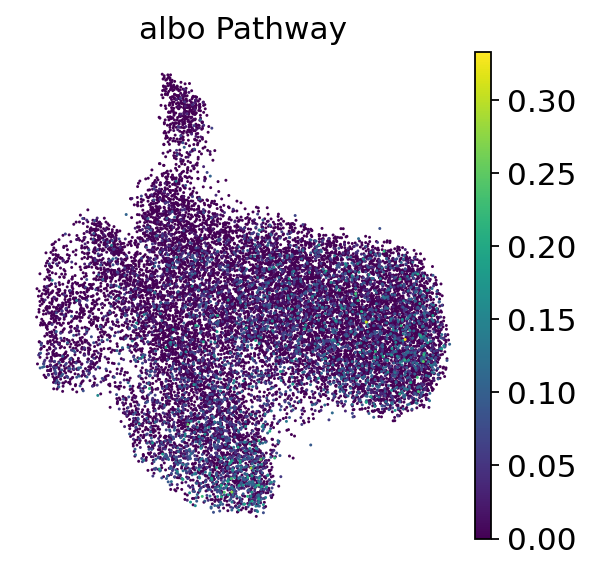

In [67]:
sc.pl.umap(
    adata,
    color=["albo Pathway"],
    frameon=False,
    ncols=2,
    wspace = 0.4,
    save='/9591-2D/emp/UMAP_albo_Pathway.pdf'
)
os.rename("figures/umap/9591-2D/emp/UMAP_albo_Pathway.pdf", 
          "../results/task3/9591-2D_emp_UMAP_albo_Pathway.pdf")

In [68]:
#sc.pl.umap(
#    adata,
#    color=["blownup Pathway"],
#    frameon=False,
#    ncols=2,
#    wspace = 0.4,
#    save='/9591-2D/emp/UMAP_blownup_Pathway.pdf'
#)
#os.rename("figures/umap/9591-2D/emp/UMAP_blownup_Pathway.pdf", 
#          "../results/task3/9591-2D_emp_UMAP_blownup_Pathway.pdf")

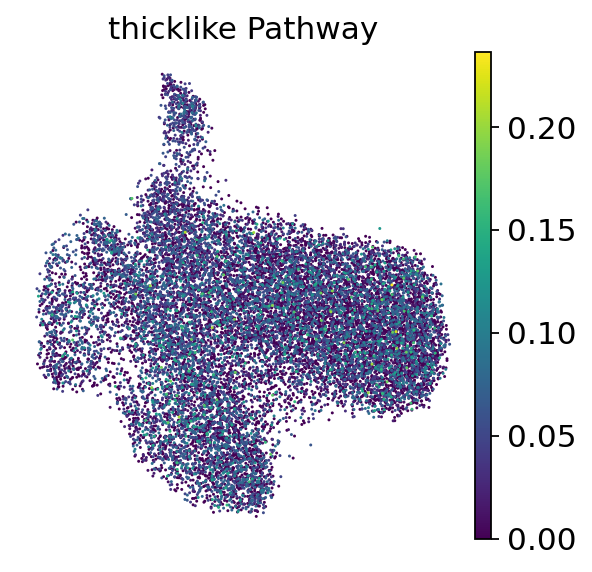

In [69]:
sc.pl.umap(
    adata,
    color=["thicklike Pathway"],
    frameon=False,
    ncols=2,
    wspace = 0.4,
    save='/9591-2D/emp/UMAP_thicklike_Pathway.pdf'
)
os.rename("figures/umap/9591-2D/emp/UMAP_thicklike_Pathway.pdf", 
          "../results/task3/9591-2D_emp_UMAP_thicklike_Pathway.pdf")

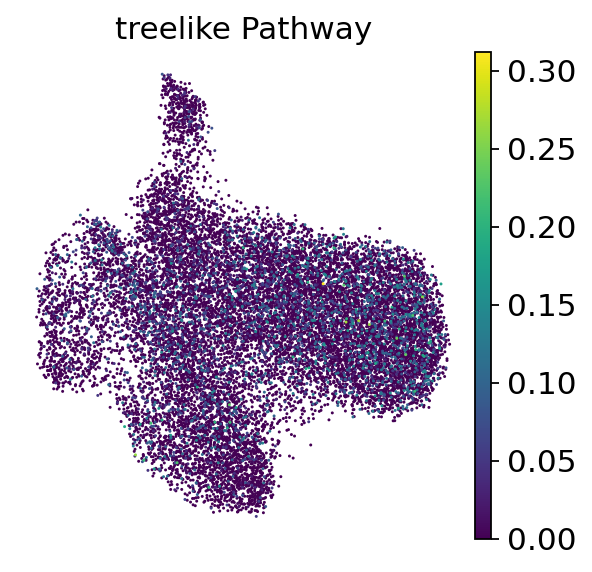

In [70]:
sc.pl.umap(
    adata,
    color=["treelike Pathway"],
    frameon=False,
    ncols=2,
    wspace = 0.4,
    save='/9591-2D/emp/UMAP_treelike_Pathway.pdf'
)
os.rename("figures/umap/9591-2D/emp/UMAP_treelike_Pathway.pdf", 
          "../results/task3/9591-2D_emp_UMAP_treelike_Pathway.pdf")

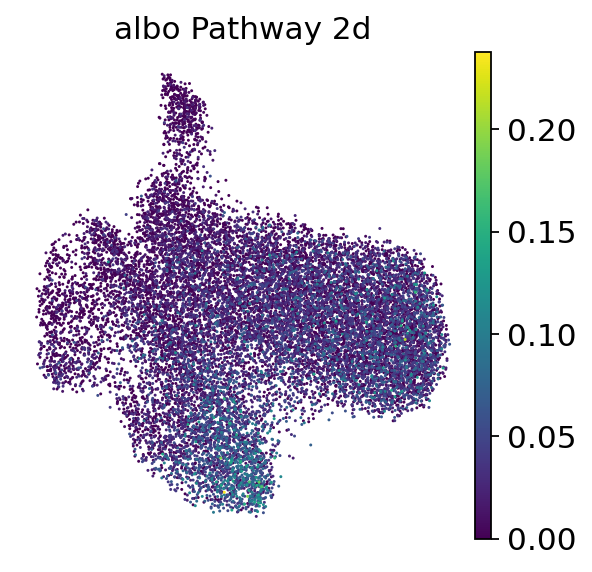

In [71]:
sc.pl.umap(
    adata,
    color=["albo Pathway 2d"],
    frameon=False,
    ncols=2,
    wspace = 0.4,
    save='/9591-2D/emp/UMAP_albo_Pathway2d.pdf'
)
os.rename("figures/umap/9591-2D/emp/UMAP_albo_Pathway2d.pdf", 
          "../results/task3/9591-2D_emp_UMAP_albo_Pathway2d.pdf")

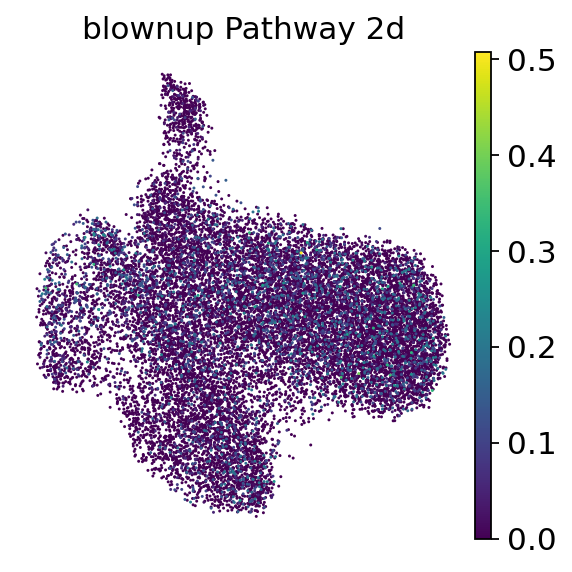

In [72]:
sc.pl.umap(
    adata,
    color=["blownup Pathway 2d"],
    frameon=False,
    ncols=2,
    wspace = 0.4,
    save='/9591-2D/emp/UMAP_blownup_Pathway2d.pdf'
)
os.rename("figures/umap/9591-2D/emp/UMAP_blownup_Pathway2d.pdf", 
          "../results/task3/9591-2D_emp_UMAP_blownup_Pathway2d.pdf")

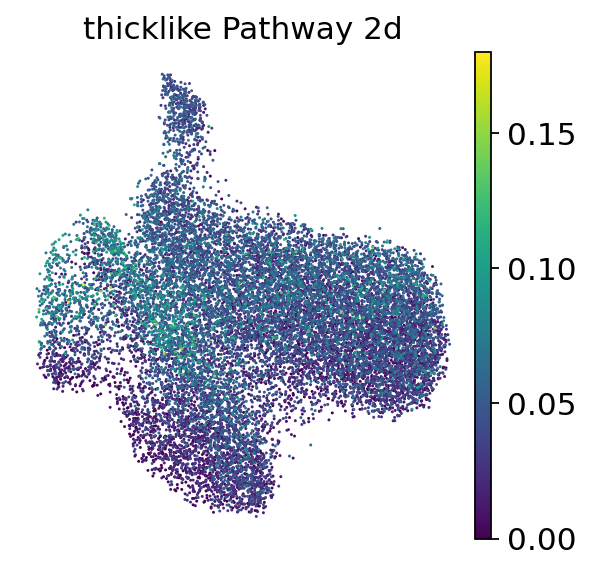

In [73]:
sc.pl.umap(
    adata,
    color=["thicklike Pathway 2d"],
    frameon=False,
    ncols=2,
    wspace = 0.4,
    save='/9591-2D/emp/UMAP_thicklike_Pathway2d.pdf'
)
os.rename("figures/umap/9591-2D/emp/UMAP_thicklike_Pathway2d.pdf", 
          "../results/task3/9591-2D_emp_UMAP_thicklike_Pathway2d.pdf")

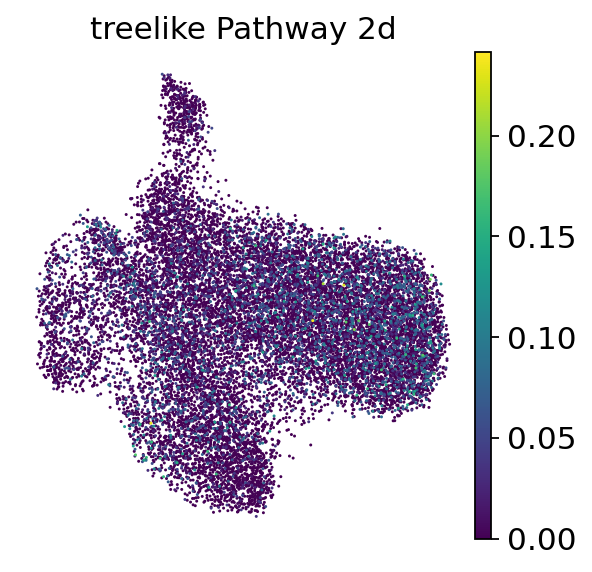

In [74]:
sc.pl.umap(
    adata,
    color=["treelike Pathway 2d"],
    frameon=False,
    ncols=2,
    wspace = 0.4,
    save='/9591-2D/emp/UMAP_treelike_Pathway2d.pdf'
)
os.rename("figures/umap/9591-2D/emp/UMAP_treelike_Pathway2d.pdf", 
          "../results/task3/9591-2D_emp_UMAP_treelike_Pathway2d.pdf")

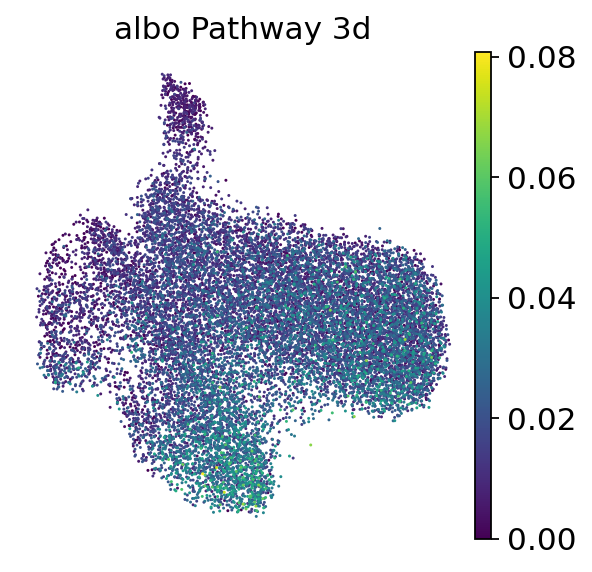

In [75]:
sc.pl.umap(
    adata,
    color=["albo Pathway 3d"],
    frameon=False,
    ncols=2,
    wspace = 0.4,
    save='/9591-2D/emp/UMAP_albo_Pathway3d.pdf'
)
os.rename("figures/umap/9591-2D/emp/UMAP_albo_Pathway3d.pdf", 
          "../results/task3/9591-2D_emp_UMAP_albo_Pathway3d.pdf")

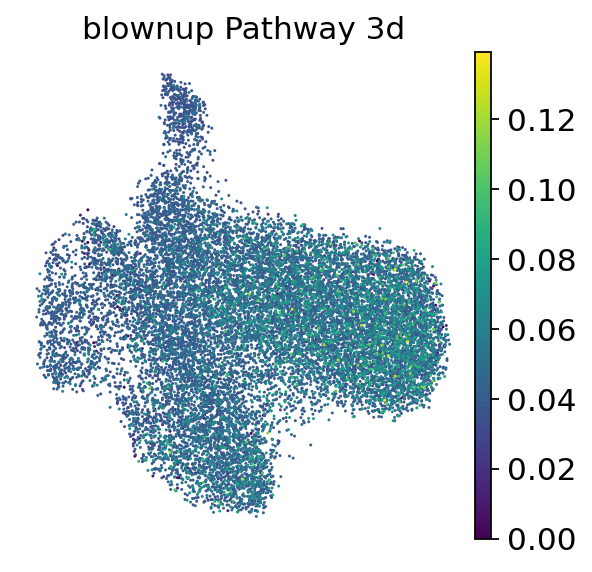

In [76]:
sc.pl.umap(
    adata,
    color=["blownup Pathway 3d"],
    frameon=False,
    ncols=2,
    wspace = 0.4,
    save='/9591-2D/emp/UMAP_blownup_Pathway3d.pdf'
)
os.rename("figures/umap/9591-2D/emp/UMAP_blownup_Pathway3d.pdf", 
          "../results/task3/9591-2D_emp_UMAP_blownup_Pathway3d.pdf")

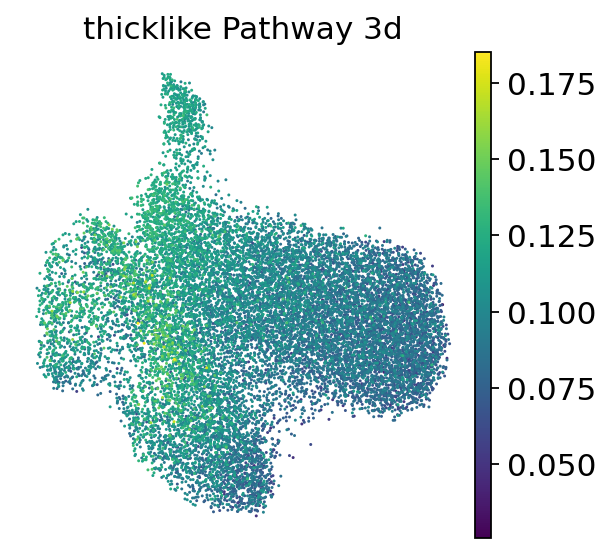

In [77]:
sc.pl.umap(
    adata,
    color=["thicklike Pathway 3d"],
    frameon=False,
    ncols=2,
    wspace = 0.4,
    save='/9591-2D/emp/UMAP_thicklike_Pathway3d.pdf'
)
os.rename("figures/umap/9591-2D/emp/UMAP_thicklike_Pathway3d.pdf", 
          "../results/task3/9591-2D_emp_UMAP_thicklike_Pathway3d.pdf")

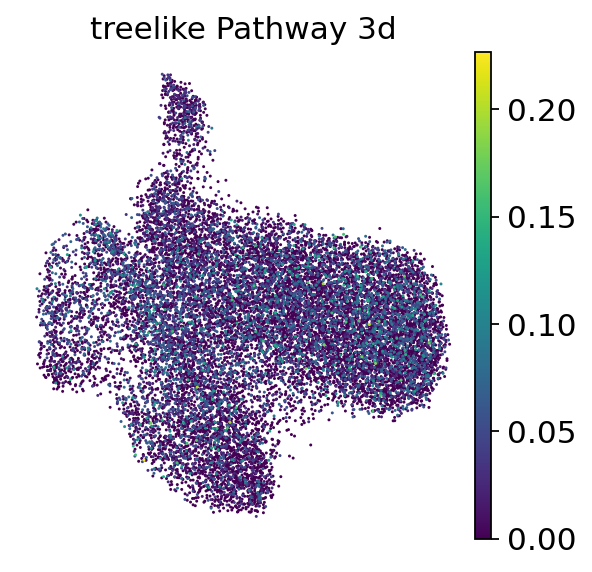

In [78]:
sc.pl.umap(
    adata,
    color=["treelike Pathway 3d"],
    frameon=False,
    ncols=2,
    wspace = 0.4,
    save='/9591-2D/emp/UMAP_treelike_Pathway3d.pdf'
)
os.rename("figures/umap/9591-2D/emp/UMAP_treelike_Pathway3d.pdf", 
          "../results/task3/9591-2D_emp_UMAP_treelike_Pathway3d.pdf")

### New gene sets

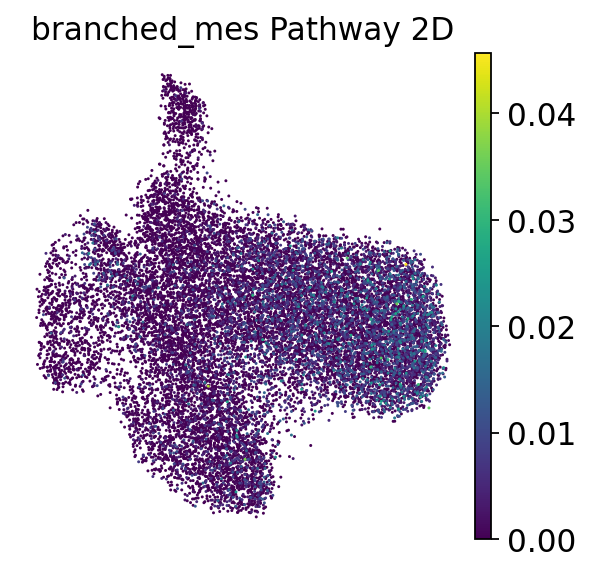

In [99]:
sc.pl.umap(
    adata,
    color=["branched_mes Pathway 2D"],
    frameon=False,
    ncols=2,
    wspace=0.4,
    save='/9591-2D/emp/UMAP_branched_mes_Pathway2D.pdf'
)
os.rename("figures/umap/9591-2D/emp/UMAP_branched_mes_Pathway2D.pdf", 
          "../results/task3/revisions/9591-2D_emp_UMAP_branched_mes_Pathway2D.pdf")


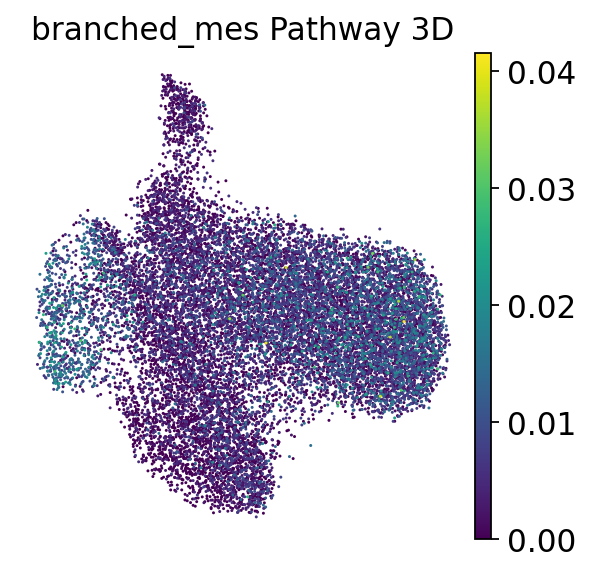

In [100]:
sc.pl.umap(
    adata,
    color=["branched_mes Pathway 3D"],
    frameon=False,
    ncols=2,
    wspace=0.4,
    save='/9591-2D/emp/UMAP_branched_mes_Pathway3D.pdf'
)
os.rename("figures/umap/9591-2D/emp/UMAP_branched_mes_Pathway3D.pdf", 
          "../results/task3/revisions/9591-2D_emp_UMAP_branched_mes_Pathway3D.pdf")


In [ ]:
sc.pl.umap(
    adata,
    color=["cystic Pathway 2D"],
    frameon=False,
    ncols=2,
    wspace=0.4,
    save='/9591-2D/emp/UMAP_cystic_Pathway2D.pdf'
)
os.rename("figures/umap/9591-2D/emp/UMAP_cystic_Pathway2D.pdf", 
          "../results/task3/revisions/9591-2D_emp_UMAP_cystic_Pathway2D.pdf")


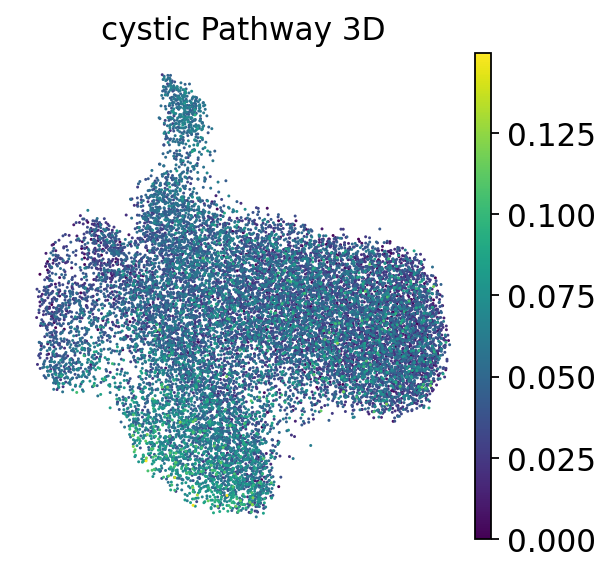

In [105]:
sc.pl.umap(
    adata,
    color=["cystic Pathway 3D"],
    frameon=False,
    ncols=2,
    wspace=0.4,
    save='/9591-2D/emp/UMAP_cystic_Pathway3D.pdf'
)
os.rename("figures/umap/9591-2D/emp/UMAP_cystic_Pathway3D.pdf", 
          "../results/task3/revisions/9591-2D_emp_UMAP_cystic_Pathway3D.pdf")


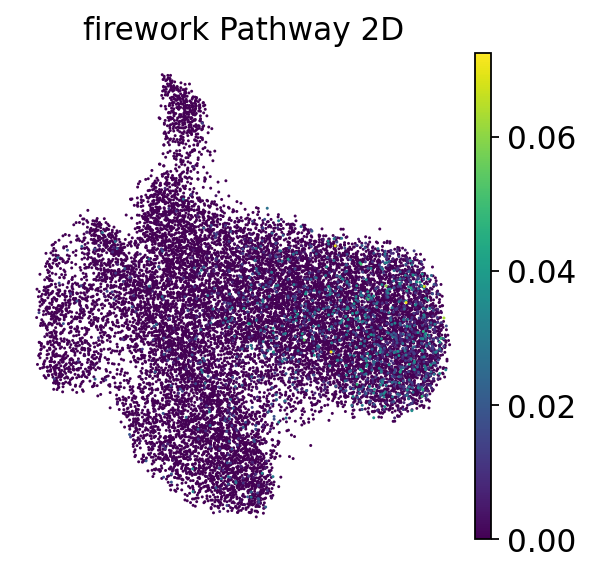

In [106]:
sc.pl.umap(
    adata,
    color=["firework Pathway 2D"],
    frameon=False,
    ncols=2,
    wspace=0.4,
    save='/9591-2D/emp/UMAP_firework_Pathway2D.pdf'
)
os.rename("figures/umap/9591-2D/emp/UMAP_firework_Pathway2D.pdf", 
          "../results/task3/revisions/9591-2D_emp_UMAP_firework_Pathway2D.pdf")


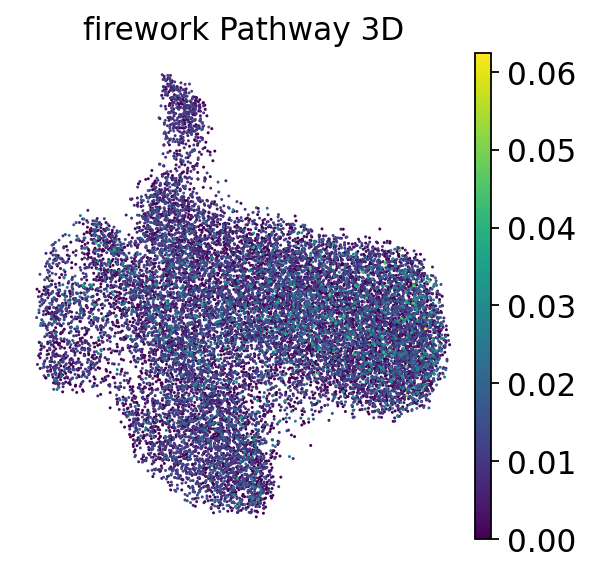

In [107]:
sc.pl.umap(
    adata,
    color=["firework Pathway 3D"],
    frameon=False,
    ncols=2,
    wspace=0.4,
    save='/9591-2D/emp/UMAP_firework_Pathway3D.pdf'
)
os.rename("figures/umap/9591-2D/emp/UMAP_firework_Pathway3D.pdf", 
          "../results/task3/revisions/9591-2D_emp_UMAP_firework_Pathway3D.pdf")


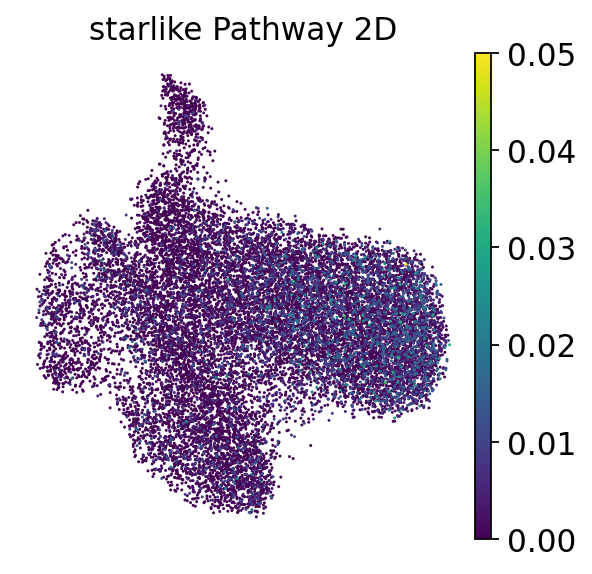

In [108]:
sc.pl.umap(
    adata,
    color=["starlike Pathway 2D"],
    frameon=False,
    ncols=2,
    wspace=0.4,
    save='/9591-2D/emp/UMAP_starlike_Pathway2D.pdf'
)
os.rename("figures/umap/9591-2D/emp/UMAP_starlike_Pathway2D.pdf", 
          "../results/task3/revisions/9591-2D_emp_UMAP_starlike_Pathway2D.pdf")


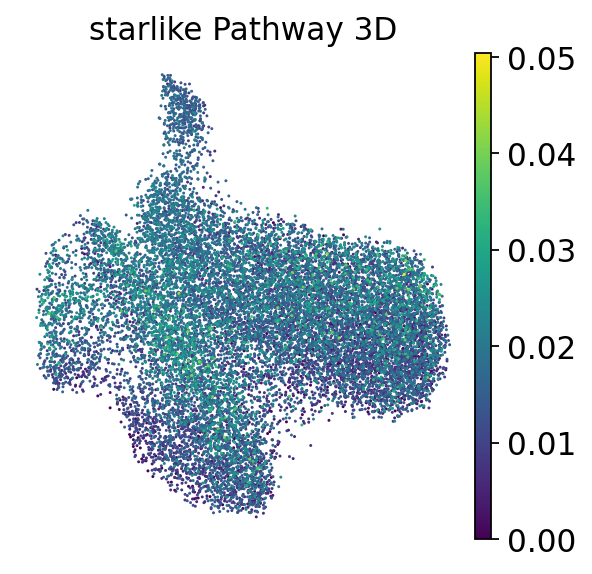

In [109]:
sc.pl.umap(
    adata,
    color=["starlike Pathway 3D"],
    frameon=False,
    ncols=2,
    wspace=0.4,
    save='/9591-2D/emp/UMAP_starlike_Pathway3D.pdf'
)
os.rename("figures/umap/9591-2D/emp/UMAP_starlike_Pathway3D.pdf", 
          "../results/task3/revisions/9591-2D_emp_UMAP_starlike_Pathway3D.pdf")


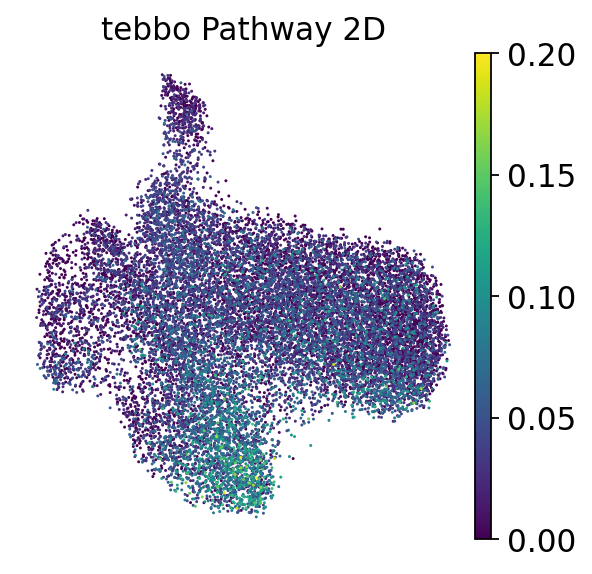

In [110]:
sc.pl.umap(
    adata,
    color=["tebbo Pathway 2D"],
    frameon=False,
    ncols=2,
    wspace=0.4,
    save='/9591-2D/emp/UMAP_tebbo_Pathway2D.pdf'
)
os.rename("figures/umap/9591-2D/emp/UMAP_tebbo_Pathway2D.pdf", 
          "../results/task3/revisions/9591-2D_emp_UMAP_tebbo_Pathway2D.pdf")


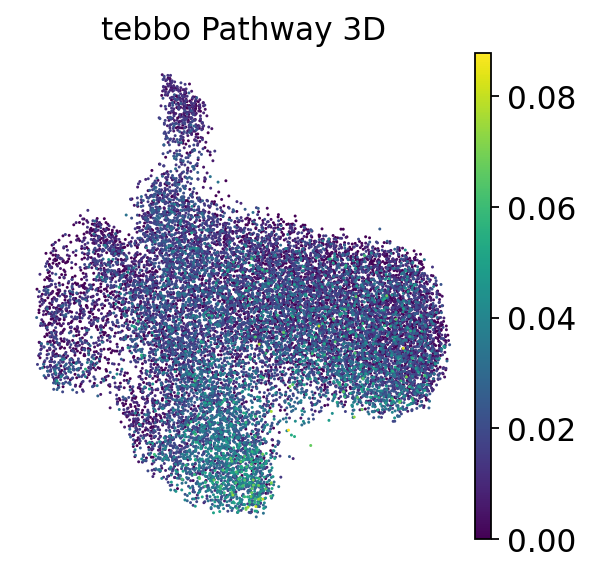

In [111]:
sc.pl.umap(
    adata,
    color=["tebbo Pathway 3D"],
    frameon=False,
    ncols=2,
    wspace=0.4,
    save='/9591-2D/emp/UMAP_tebbo_Pathway3D.pdf'
)
os.rename("figures/umap/9591-2D/emp/UMAP_tebbo_Pathway3D.pdf", 
          "../results/task3/revisions/9591-2D_emp_UMAP_tebbo_Pathway3D.pdf")


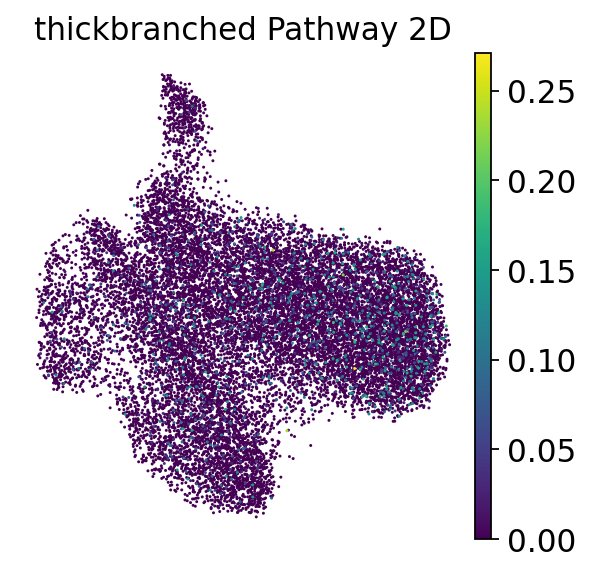

In [112]:
sc.pl.umap(
    adata,
    color=["thickbranched Pathway 2D"],
    frameon=False,
    ncols=2,
    wspace=0.4,
    save='/9591-2D/emp/UMAP_thickbranched_Pathway2D.pdf'
)
os.rename("figures/umap/9591-2D/emp/UMAP_thickbranched_Pathway2D.pdf", 
          "../results/task3/revisions/9591-2D_emp_UMAP_thickbranched_Pathway2D.pdf")


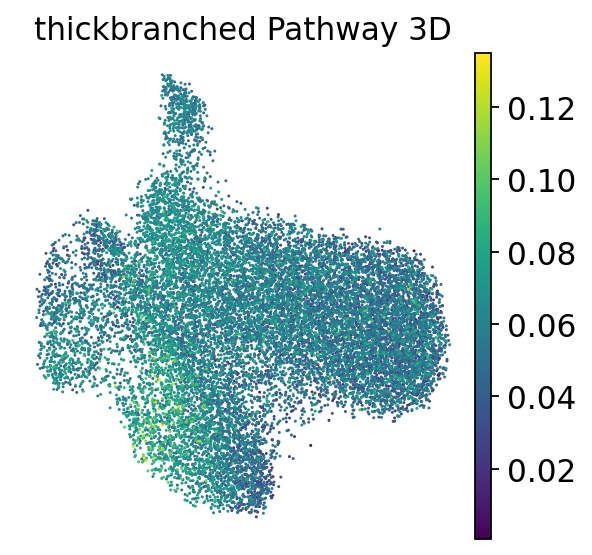

In [113]:
sc.pl.umap(
    adata,
    color=["thickbranched Pathway 3D"],
    frameon=False,
    ncols=2,
    wspace=0.4,
    save='/9591-2D/emp/UMAP_thickbranched_Pathway3D.pdf'
)
os.rename("figures/umap/9591-2D/emp/UMAP_thickbranched_Pathway3D.pdf", 
          "../results/task3/revisions/9591-2D_emp_UMAP_thickbranched_Pathway3D.pdf")


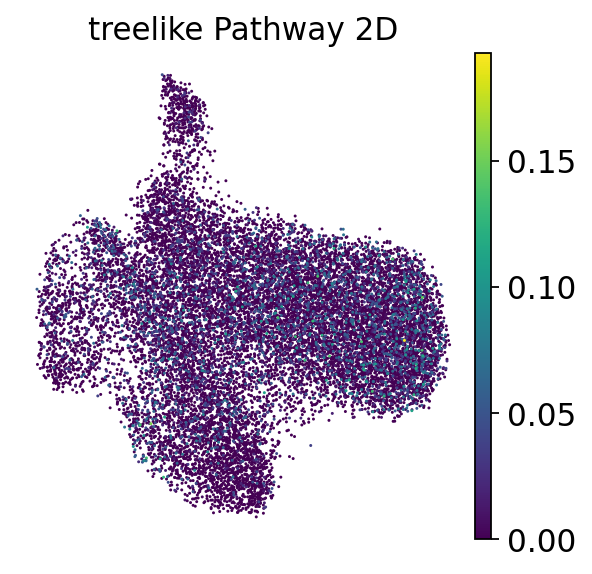

In [114]:
sc.pl.umap(
    adata,
    color=["treelike Pathway 2D"],
    frameon=False,
    ncols=2,
    wspace=0.4,
    save='/9591-2D/emp/UMAP_treelike_Pathway2D.pdf'
)
os.rename("figures/umap/9591-2D/emp/UMAP_treelike_Pathway2D.pdf", 
          "../results/task3/revisions/9591-2D_emp_UMAP_treelike_Pathway2D.pdf")


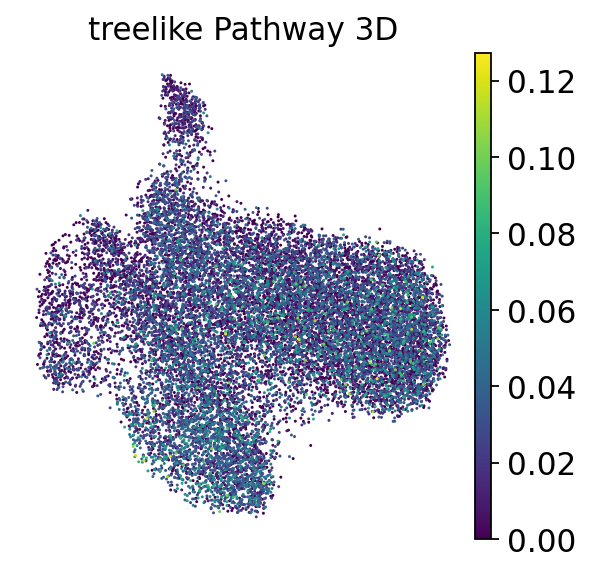

In [115]:
sc.pl.umap(
    adata,
    color=["treelike Pathway 3D"],
    frameon=False,
    ncols=2,
    wspace=0.4,
    save='/9591-2D/emp/UMAP_treelike_Pathway3D.pdf'
)
os.rename("figures/umap/9591-2D/emp/UMAP_treelike_Pathway3D.pdf", 
          "../results/task3/revisions/9591-2D_emp_UMAP_treelike_Pathway3D.pdf")


## Violin

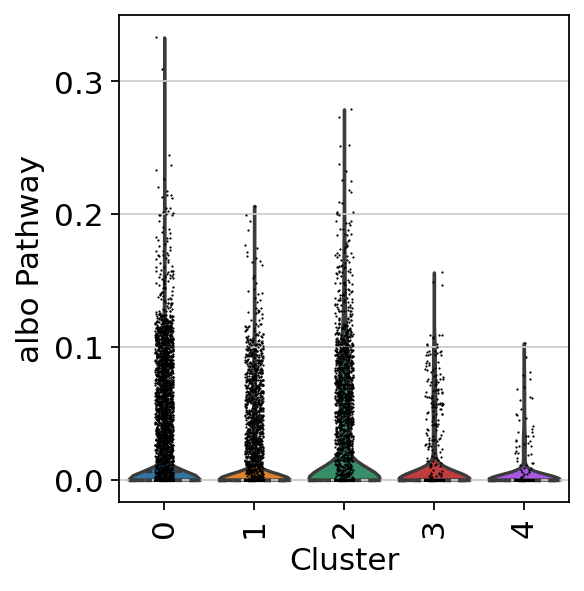

In [79]:
sc.pl.violin(adata, 
             keys=["albo Pathway"],
             groupby='Cluster', 
             rotation=90,
             xlabel='Cluster',
             inner="quartile",
             wspace = 0.4,
             save='/9591-2D/emp_violin_counts_UMAP_albo_Pathway.pdf'
            )
os.rename("figures/violin/9591-2D/emp_violin_counts_UMAP_albo_Pathway.pdf", 
          "../results/task3/9591-2D_emp_violin_counts_UMAP_albo_Pathway.pdf")

In [80]:
#sc.pl.violin(adata, 
#             keys=["blownup Pathway"],
#             groupby='Cluster', 
#             rotation=90,
#             xlabel='Cluster',
#             inner="quartile",
#             wspace = 0.4,
#             save='/9591-2D/emp_violin_counts_blownup_Pathway.pdf'
#            )
#os.rename("figures/violin/9591-2D/emp_violin_counts_blownup_Pathway.pdf", 
#          "../results/task3/9591-2D_emp_violin_counts_blownup_Pathway.pdf")

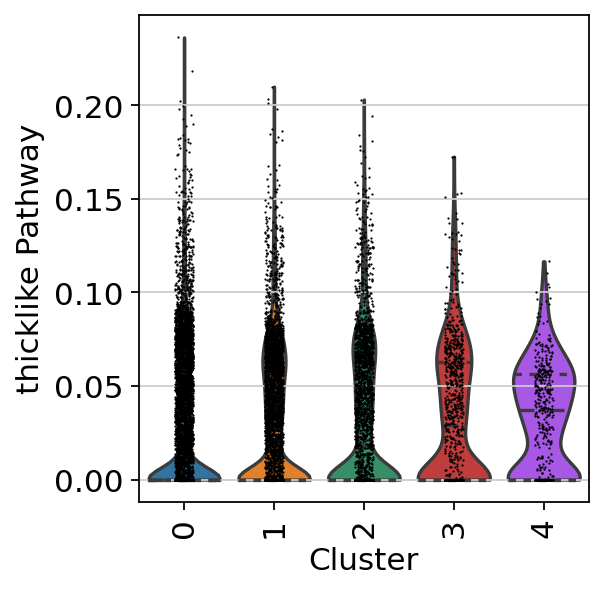

In [81]:
sc.pl.violin(adata, 
             keys=["thicklike Pathway"],
             groupby='Cluster', 
             rotation=90,
             xlabel='Cluster',
             inner="quartile",
             wspace = 0.4,
             save='/9591-2D/emp_violin_counts_thicklike_Pathway.pdf'
            )
os.rename("figures/violin/9591-2D/emp_violin_counts_thicklike_Pathway.pdf", 
          "../results/task3/9591-2D_emp_violin_counts_thicklike_Pathway.pdf")

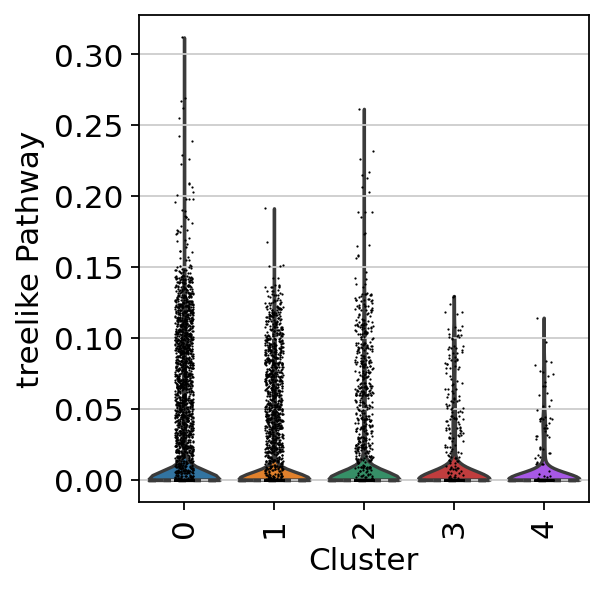

In [82]:
sc.pl.violin(adata, 
             keys=["treelike Pathway"],
             groupby='Cluster', 
             rotation=90,
             xlabel='Cluster',
             inner="quartile",
             wspace = 0.4,
             save='/9591-2D/emp_violin_counts_treelike_Pathway.pdf'
            )
os.rename("figures/violin/9591-2D/emp_violin_counts_treelike_Pathway.pdf", 
          "../results/task3/9591-2D_emp_violin_counts_treelike_Pathway.pdf")

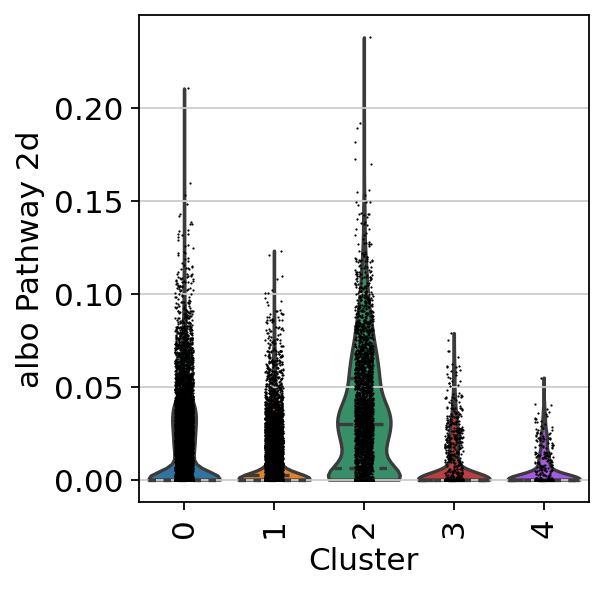

In [83]:
sc.pl.violin(adata, 
             keys=["albo Pathway 2d"],
             groupby='Cluster', 
             rotation=90,
             xlabel='Cluster',
             inner="quartile",
             wspace = 0.4,
             save='/9591-2D/emp_violin_counts_UMAP_albo_Pathway2d.pdf'
            )
os.rename("figures/violin/9591-2D/emp_violin_counts_UMAP_albo_Pathway2d.pdf", 
          "../results/task3/9591-2D_emp_violin_counts_UMAP_albo_Pathway2d.pdf")

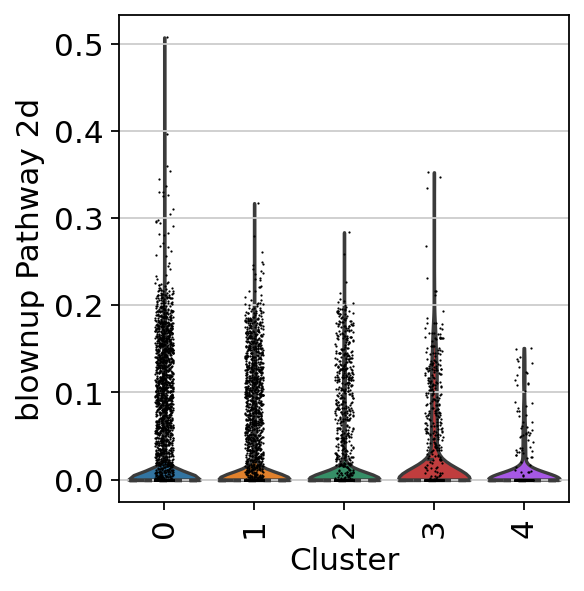

In [84]:
sc.pl.violin(adata, 
             keys=["blownup Pathway 2d"],
             groupby='Cluster', 
             rotation=90,
             xlabel='Cluster',
             inner="quartile",
             wspace = 0.4,
             save='/9591-2D/emp_violin_counts_blownup_Pathway2d.pdf'
            )
os.rename("figures/violin/9591-2D/emp_violin_counts_blownup_Pathway2d.pdf", 
          "../results/task3/9591-2D_emp_violin_counts_blownup_Pathway2d.pdf")

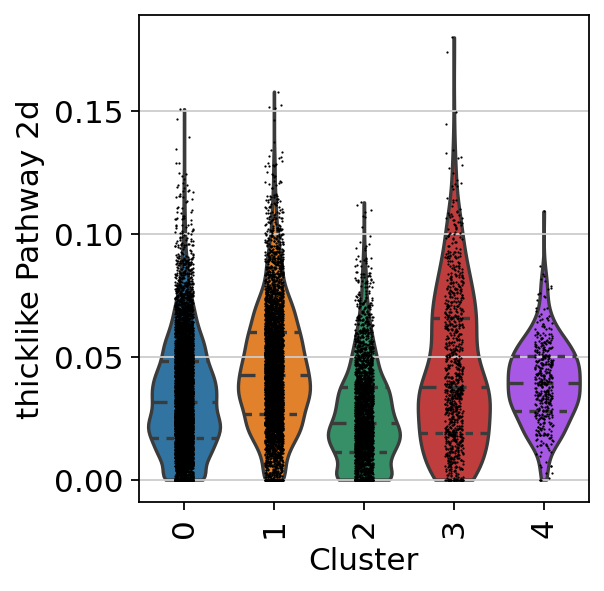

In [85]:
sc.pl.violin(adata, 
             keys=["thicklike Pathway 2d"],
             groupby='Cluster', 
             rotation=90,
             xlabel='Cluster',
             inner="quartile",
             wspace = 0.4,
             save='/9591-2D/emp_violin_counts_thicklike_Pathway2d.pdf'
            )
os.rename("figures/violin/9591-2D/emp_violin_counts_thicklike_Pathway2d.pdf", 
          "../results/task3/9591-2D_emp_violin_counts_thicklike_Pathway2d.pdf")

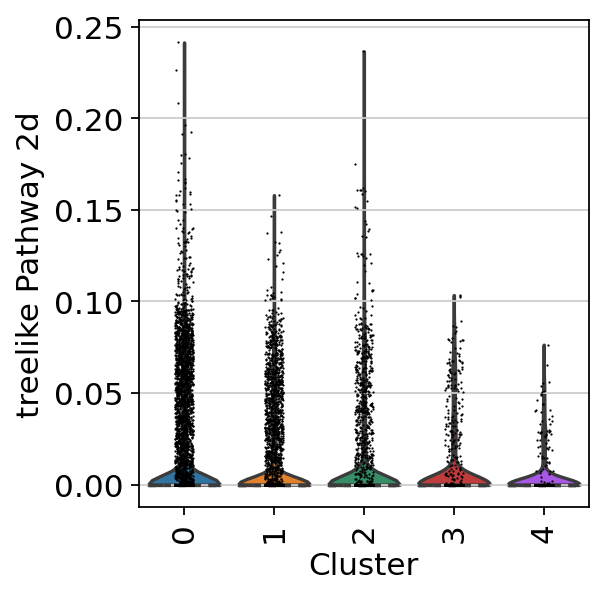

In [86]:
sc.pl.violin(adata, 
             keys=["treelike Pathway 2d"],
             groupby='Cluster', 
             rotation=90,
             xlabel='Cluster',
             inner="quartile",
             wspace = 0.4,
             save='/9591-2D/emp_violin_counts_treelike_Pathway2d.pdf'
            )
os.rename("figures/violin/9591-2D/emp_violin_counts_treelike_Pathway2d.pdf", 
          "../results/task3/9591-2D_emp_violin_counts_treelike_Pathway2d.pdf")

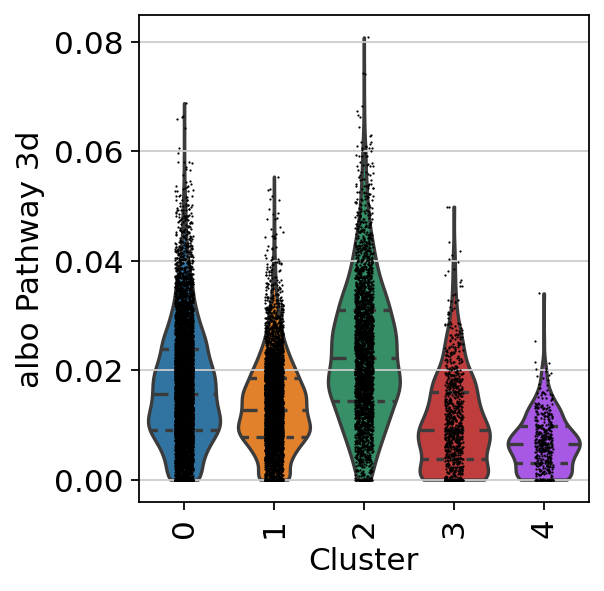

In [87]:
sc.pl.violin(adata, 
             keys=["albo Pathway 3d"],
             groupby='Cluster', 
             rotation=90,
             xlabel='Cluster',
             inner="quartile",
             wspace = 0.4,
             save='/9591-2D/emp_violin_counts_UMAP_albo_Pathway3d.pdf'
            )
os.rename("figures/violin/9591-2D/emp_violin_counts_UMAP_albo_Pathway3d.pdf", 
          "../results/task3/9591-2D_emp_violin_counts_UMAP_albo_Pathway3d.pdf")

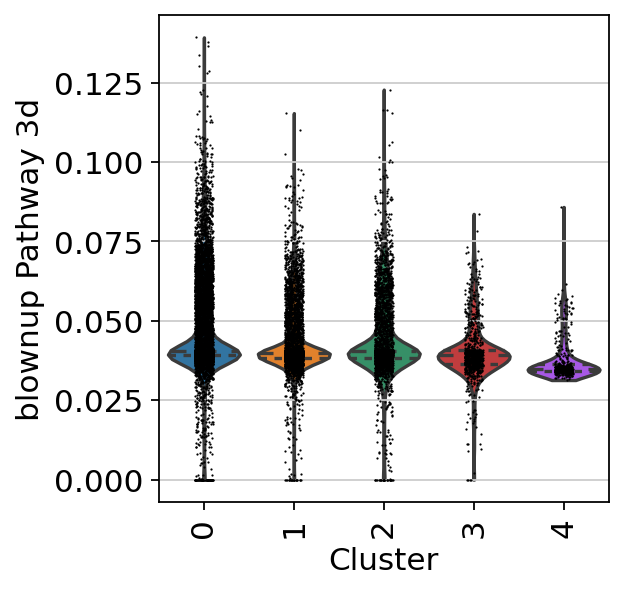

In [88]:
sc.pl.violin(adata, 
             keys=["blownup Pathway 3d"],
             groupby='Cluster', 
             rotation=90,
             xlabel='Cluster',
             inner="quartile",
             wspace = 0.4,
             save='/9591-2D/emp_violin_counts_blownup_Pathway3d.pdf'
            )
os.rename("figures/violin/9591-2D/emp_violin_counts_blownup_Pathway3d.pdf", 
          "../results/task3/9591-2D_emp_violin_counts_blownup_Pathway3d.pdf")

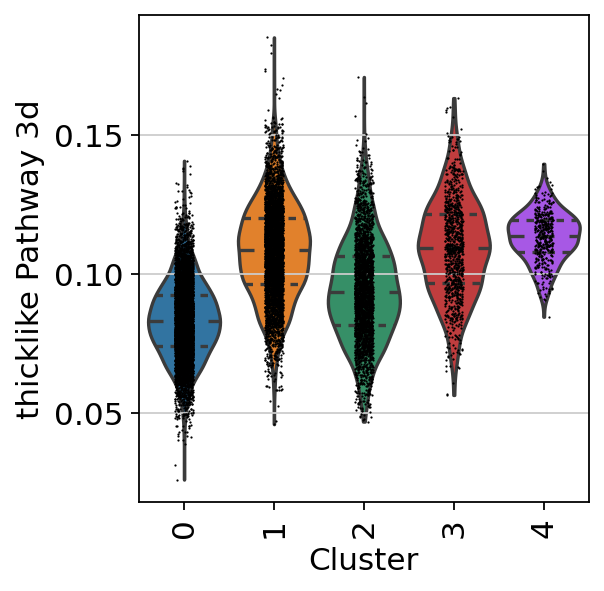

In [90]:
sc.pl.violin(adata, 
             keys=["thicklike Pathway 3d"],
             groupby='Cluster', 
             rotation=90,
             xlabel='Cluster',
             inner="quartile",
             wspace = 0.4,
             save='/9591-2D/emp_violin_counts_thicklike_Pathway3d.pdf'
            )
os.rename("figures/violin/9591-2D/emp_violin_counts_thicklike_Pathway3d.pdf", 
          "../results/task3/9591-2D_emp_violin_counts_thicklike_Pathway3d.pdf")

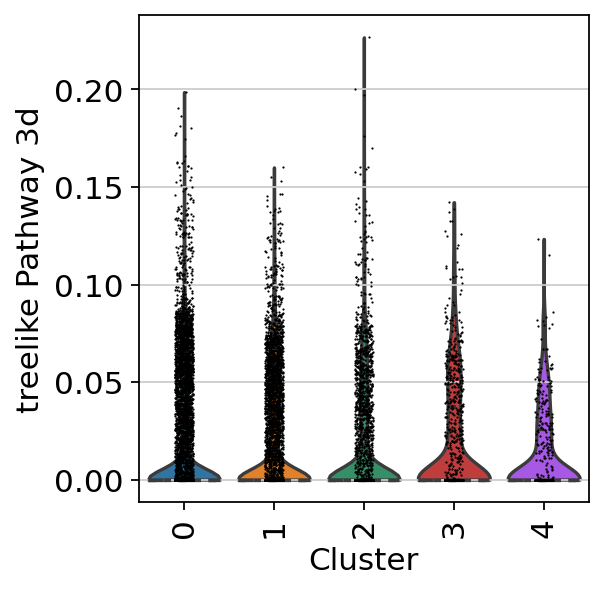

In [91]:
sc.pl.violin(adata, 
             keys=["treelike Pathway 3d"],
             groupby='Cluster', 
             rotation=90,
             xlabel='Cluster',
             inner="quartile",
             wspace = 0.4,
             save='/9591-2D/emp_violin_counts_treelike_Pathway3d.pdf'
            )
os.rename("figures/violin/9591-2D/emp_violin_counts_treelike_Pathway3d.pdf", 
          "../results/task3/9591-2D_emp_violin_counts_treelike_Pathway3d.pdf")

### New

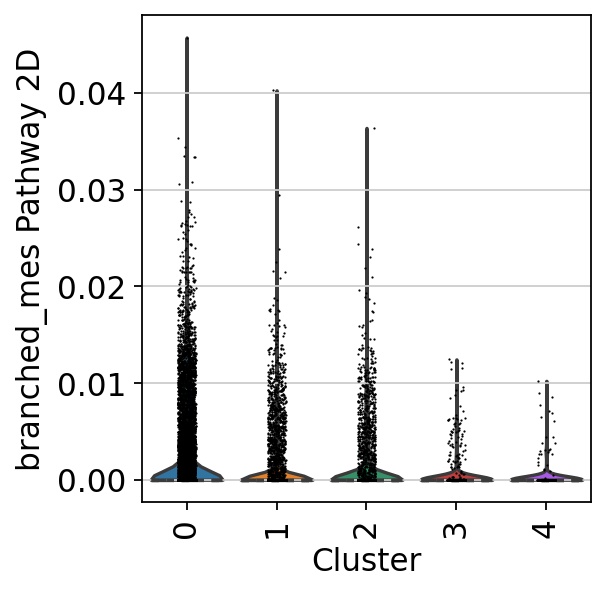

In [118]:
sc.pl.violin(adata, 
             keys=["branched_mes Pathway 2D"],
             groupby='Cluster', 
             rotation=90,
             xlabel='Cluster',
             inner="quartile",
             wspace=0.4,
             save='/9591-2D/emp_violin_counts_UMAP_branched_mes_Pathway2D.pdf'
            )
os.rename("figures/violin/9591-2D/emp_violin_counts_UMAP_branched_mes_Pathway2D.pdf", 
          "../results/task3/revisions/9591-2D_emp_violin_counts_UMAP_branched_mes_Pathway2D.pdf")


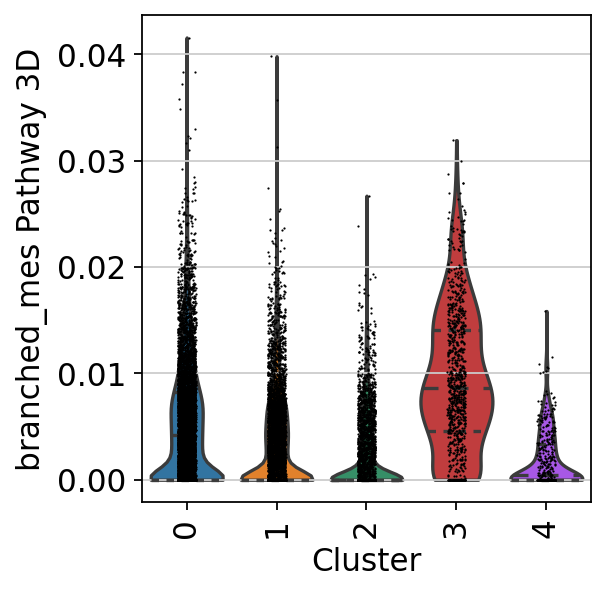

In [119]:
sc.pl.violin(adata, 
             keys=["branched_mes Pathway 3D"],
             groupby='Cluster', 
             rotation=90,
             xlabel='Cluster',
             inner="quartile",
             wspace=0.4,
             save='/9591-2D/emp_violin_counts_UMAP_branched_mes_Pathway3D.pdf'
            )
os.rename("figures/violin/9591-2D/emp_violin_counts_UMAP_branched_mes_Pathway3D.pdf", 
          "../results/task3/revisions/9591-2D_emp_violin_counts_UMAP_branched_mes_Pathway3D.pdf")


In [ ]:
sc.pl.violin(adata, 
             keys=["cystic Pathway 2D"],
             groupby='Cluster', 
             rotation=90,
             xlabel='Cluster',
             inner="quartile",
             wspace=0.4,
             save='/9591-2D/emp_violin_counts_UMAP_cystic_Pathway2D.pdf'
            )
os.rename("figures/violin/9591-2D/emp_violin_counts_UMAP_cystic_Pathway2D.pdf", 
          "../results/task3/revisions/9591-2D_emp_violin_counts_UMAP_cystic_Pathway2D.pdf")


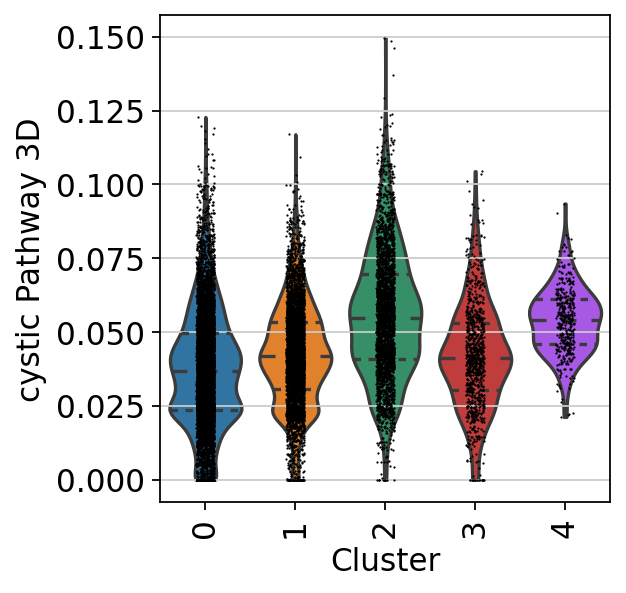

In [120]:
sc.pl.violin(adata, 
             keys=["cystic Pathway 3D"],
             groupby='Cluster', 
             rotation=90,
             xlabel='Cluster',
             inner="quartile",
             wspace=0.4,
             save='/9591-2D/emp_violin_counts_UMAP_cystic_Pathway3D.pdf'
            )
os.rename("figures/violin/9591-2D/emp_violin_counts_UMAP_cystic_Pathway3D.pdf", 
          "../results/task3/revisions/9591-2D_emp_violin_counts_UMAP_cystic_Pathway3D.pdf")


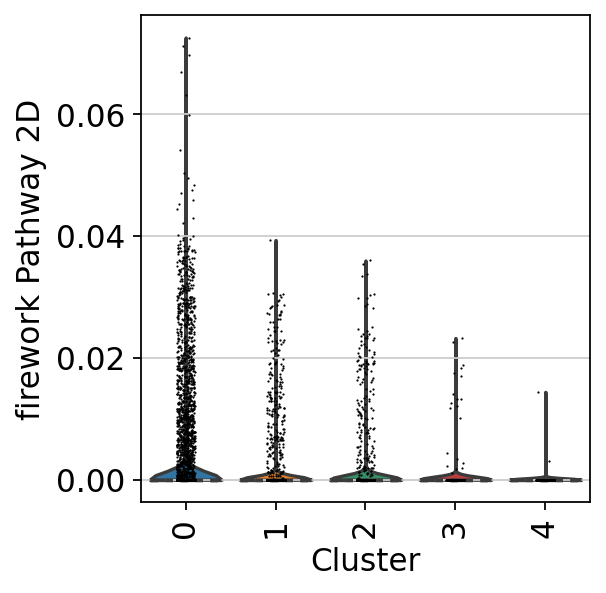

In [121]:
sc.pl.violin(adata, 
             keys=["firework Pathway 2D"],
             groupby='Cluster', 
             rotation=90,
             xlabel='Cluster',
             inner="quartile",
             wspace=0.4,
             save='/9591-2D/emp_violin_counts_UMAP_firework_Pathway2D.pdf'
            )
os.rename("figures/violin/9591-2D/emp_violin_counts_UMAP_firework_Pathway2D.pdf", 
          "../results/task3/revisions/9591-2D_emp_violin_counts_UMAP_firework_Pathway2D.pdf")


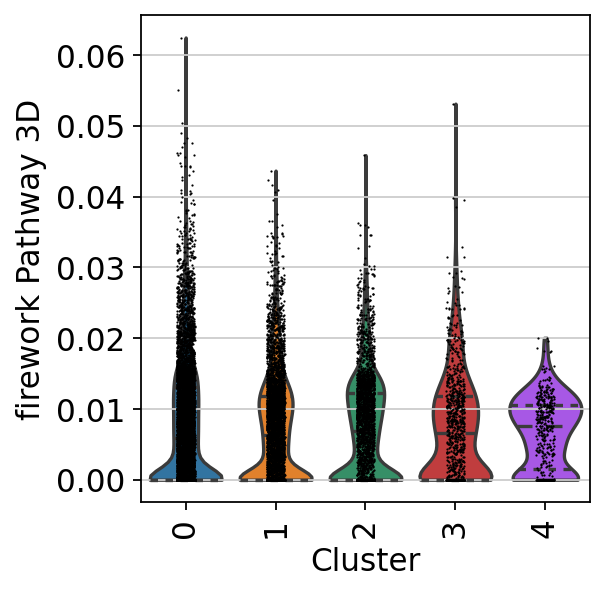

In [122]:
sc.pl.violin(adata, 
             keys=["firework Pathway 3D"],
             groupby='Cluster', 
             rotation=90,
             xlabel='Cluster',
             inner="quartile",
             wspace=0.4,
             save='/9591-2D/emp_violin_counts_UMAP_firework_Pathway3D.pdf'
            )
os.rename("figures/violin/9591-2D/emp_violin_counts_UMAP_firework_Pathway3D.pdf", 
          "../results/task3/revisions/9591-2D_emp_violin_counts_UMAP_firework_Pathway3D.pdf")


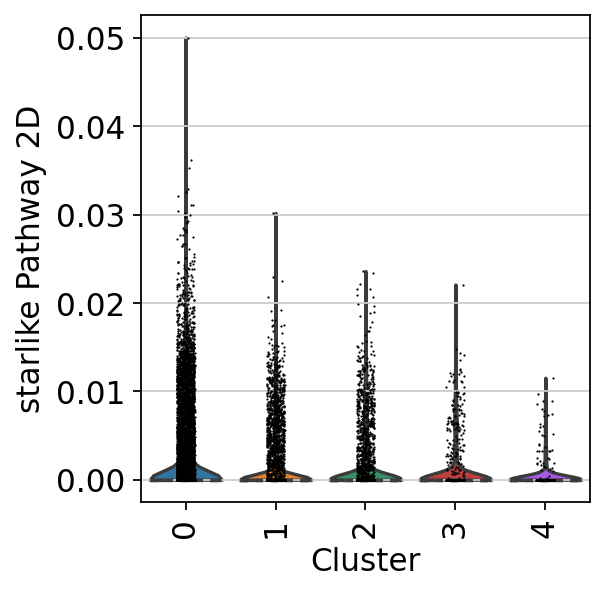

In [123]:
sc.pl.violin(adata, 
             keys=["starlike Pathway 2D"],
             groupby='Cluster', 
             rotation=90,
             xlabel='Cluster',
             inner="quartile",
             wspace=0.4,
             save='/9591-2D/emp_violin_counts_UMAP_starlike_Pathway2D.pdf'
            )
os.rename("figures/violin/9591-2D/emp_violin_counts_UMAP_starlike_Pathway2D.pdf", 
          "../results/task3/revisions/9591-2D_emp_violin_counts_UMAP_starlike_Pathway2D.pdf")


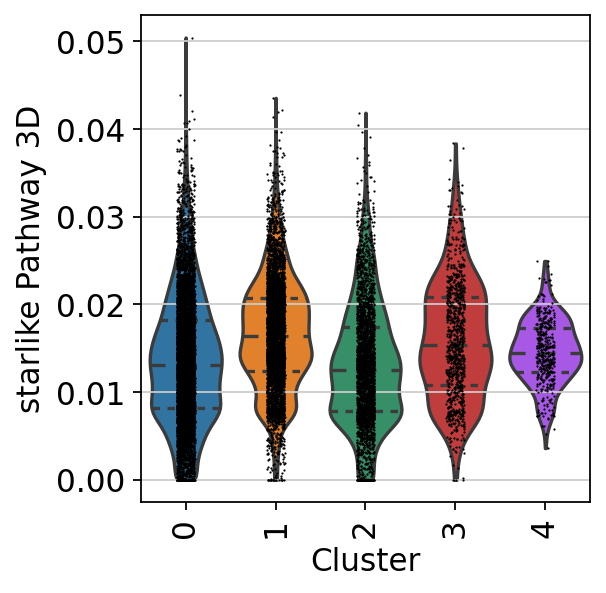

In [124]:
sc.pl.violin(adata, 
             keys=["starlike Pathway 3D"],
             groupby='Cluster', 
             rotation=90,
             xlabel='Cluster',
             inner="quartile",
             wspace=0.4,
             save='/9591-2D/emp_violin_counts_UMAP_starlike_Pathway3D.pdf'
            )
os.rename("figures/violin/9591-2D/emp_violin_counts_UMAP_starlike_Pathway3D.pdf", 
          "../results/task3/revisions/9591-2D_emp_violin_counts_UMAP_starlike_Pathway3D.pdf")


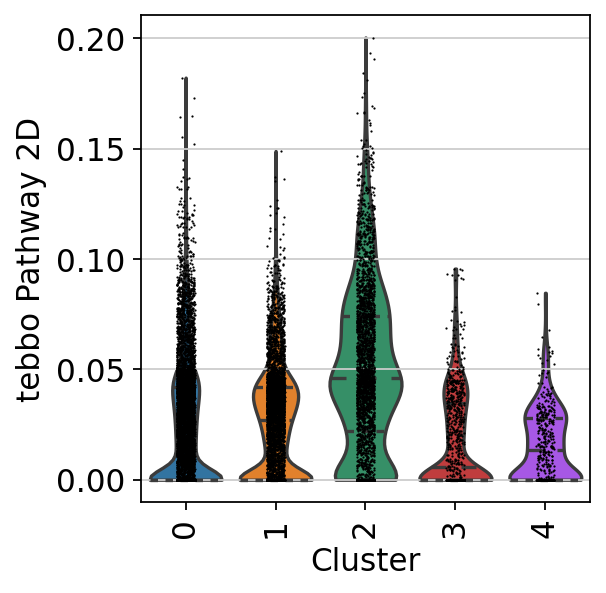

In [125]:
sc.pl.violin(adata, 
             keys=["tebbo Pathway 2D"],
             groupby='Cluster', 
             rotation=90,
             xlabel='Cluster',
             inner="quartile",
             wspace=0.4,
             save='/9591-2D/emp_violin_counts_UMAP_tebbo_Pathway2D.pdf'
            )
os.rename("figures/violin/9591-2D/emp_violin_counts_UMAP_tebbo_Pathway2D.pdf", 
          "../results/task3/revisions/9591-2D_emp_violin_counts_UMAP_tebbo_Pathway2D.pdf")


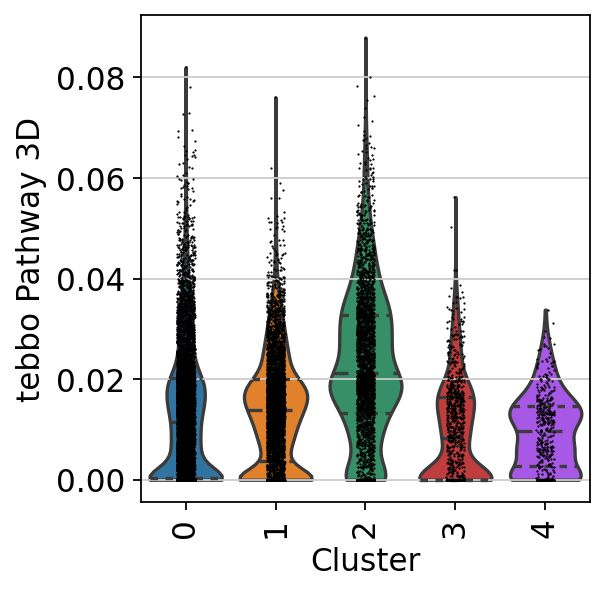

In [128]:
sc.pl.violin(adata, 
             keys=["tebbo Pathway 3D"],
             groupby='Cluster', 
             rotation=90,
             xlabel='Cluster',
             inner="quartile",
             wspace=0.4,
             save='/9591-2D/emp_violin_counts_UMAP_tebbo_Pathway3D.pdf'
            )
os.rename("figures/violin/9591-2D/emp_violin_counts_UMAP_tebbo_Pathway3D.pdf", 
          "../results/task3/revisions/9591-2D_emp_violin_counts_UMAP_tebbo_Pathway3D.pdf")


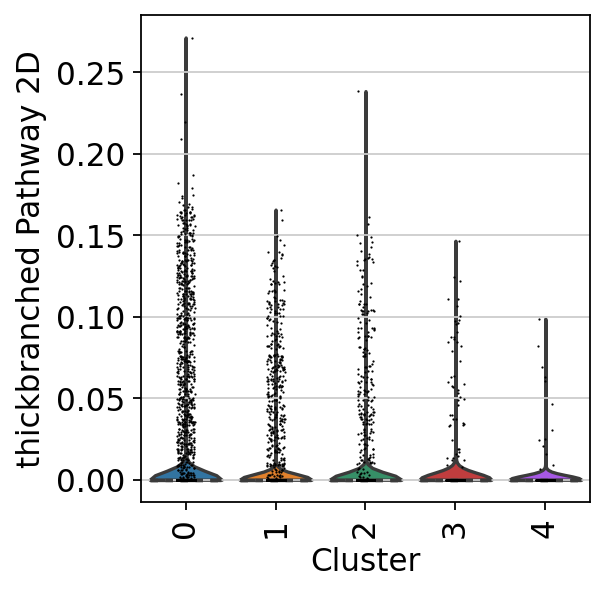

In [129]:
sc.pl.violin(adata, 
             keys=["thickbranched Pathway 2D"],
             groupby='Cluster', 
             rotation=90,
             xlabel='Cluster',
             inner="quartile",
             wspace=0.4,
             save='/9591-2D/emp_violin_counts_UMAP_thickbranched_Pathway2D.pdf'
            )
os.rename("figures/violin/9591-2D/emp_violin_counts_UMAP_thickbranched_Pathway2D.pdf", 
          "../results/task3/revisions/9591-2D_emp_violin_counts_UMAP_thickbranched_Pathway2D.pdf")


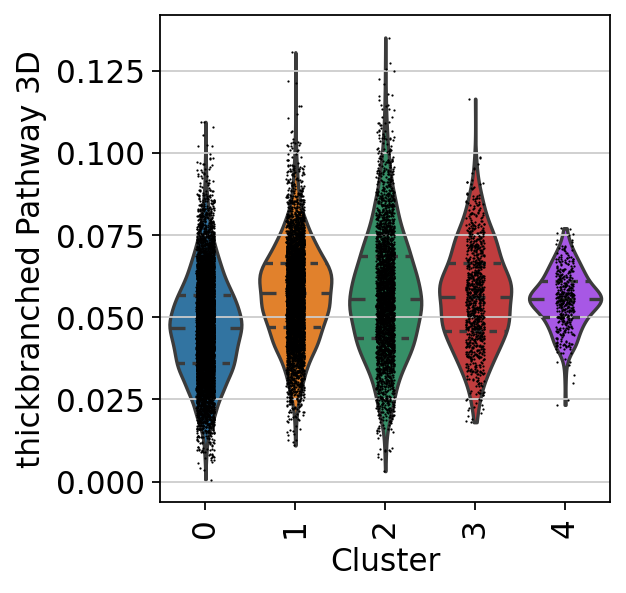

In [130]:
sc.pl.violin(adata, 
             keys=["thickbranched Pathway 3D"],
             groupby='Cluster', 
             rotation=90,
             xlabel='Cluster',
             inner="quartile",
             wspace=0.4,
             save='/9591-2D/emp_violin_counts_UMAP_thickbranched_Pathway3D.pdf'
            )
os.rename("figures/violin/9591-2D/emp_violin_counts_UMAP_thickbranched_Pathway3D.pdf", 
          "../results/task3/revisions/9591-2D_emp_violin_counts_UMAP_thickbranched_Pathway3D.pdf")


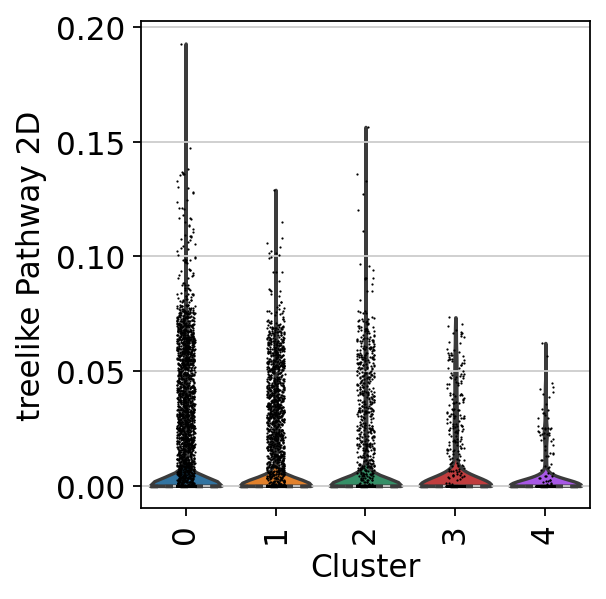

In [131]:
sc.pl.violin(adata, 
             keys=["treelike Pathway 2D"],
             groupby='Cluster', 
             rotation=90,
             xlabel='Cluster',
             inner="quartile",
             wspace=0.4,
             save='/9591-2D/emp_violin_counts_UMAP_treelike_Pathway2D.pdf'
            )
os.rename("figures/violin/9591-2D/emp_violin_counts_UMAP_treelike_Pathway2D.pdf", 
          "../results/task3/revisions/9591-2D_emp_violin_counts_UMAP_treelike_Pathway2D.pdf")


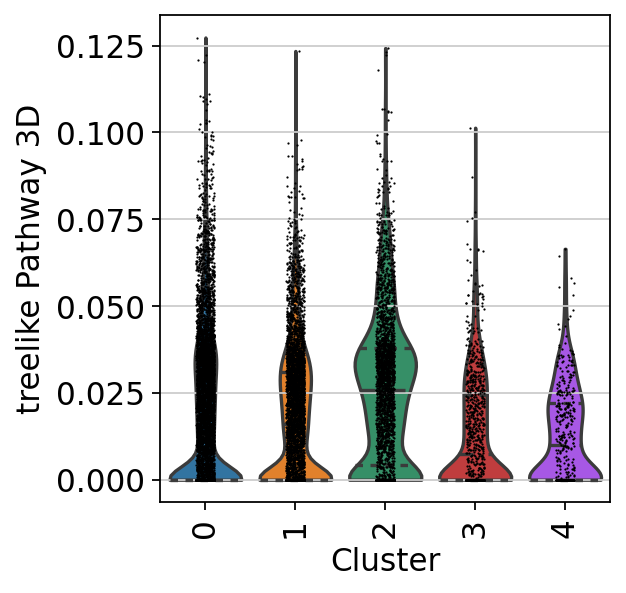

In [132]:
sc.pl.violin(adata, 
             keys=["treelike Pathway 3D"],
             groupby='Cluster', 
             rotation=90,
             xlabel='Cluster',
             inner="quartile",
             wspace=0.4,
             save='/9591-2D/emp_violin_counts_UMAP_treelike_Pathway3D.pdf'
            )
os.rename("figures/violin/9591-2D/emp_violin_counts_UMAP_treelike_Pathway3D.pdf", 
          "../results/task3/revisions/9591-2D_emp_violin_counts_UMAP_treelike_Pathway3D.pdf")
